# Remove irrelevant images

The goal is to better clean it and remove irrelevant images.
Some images could degrade or hurt the performance of our classifier. I need to take care of that.

Removing irrelevant images is the trickiest part. Indeed I have some images with text or picture explaining fossils. These are not really relevant fossil images.

These images will be harder to classify and could hurt the performance of the classifier 

I will try to automate this part.  


__Example of irrelevant images:__ 


![Alt text](data/illustrate-image/agnatha_252.jpg)
![Alt text](data/illustrate-image/avialae_31.jpg)
![Alt text](data/illustrate-image/agnatha_81.jpg)

Here is the plan to remove irrelevant images and find the best method to achieve it.

>**Note** <br>All these steps will be performed on the ``agnatha ``category. This will allow me to see the results, compare them, and choose the best model. 

### __Plan A__
__Detect irrelevant image using simple statistics.__ 

The goal is to identify images that are considered distant from the average image using the Euclidean distance of Truncated SVD representation.


 
### __Plan B__
__Use high-level features and an unsupervised machine learning (cluster)__ 

The goal is to use the silhouette score for each cluster to identify images that are below the average silhouette score and consider them as outliers.


### __Plan C__

__Use deep learning to remove irrelevant images__

The goal is to use deep learning to classify fossils. By doing so, I can use the probability generated by my model to determine if the images are fossils (0) or not fossils (1), thereby removing them.

So let's start.

## Detect irrelevant image using simple statistics
The goal is to identify images that are considered distant from the average image using the Euclidean distance of Truncated SVD representation. 

I chose Truncated SVD over PCA because it better aligns with the specific characteristics of my image dataset, offers computational efficiency, and is well-suited for my primary goal of identifying images that are distant from the average image representation.

Steps: 

1. Loop over all images in a directory and reprocess them by doing the following steps:
    - Load the images.
    - Resizes the image (224, 244). 
    - Convert images to grayscale using ``.convert('L')``. This technique will reduce the computation time by using 1 channel (grayscale) instead of 3 channels (RGB) colors.
    - Flatten the images to 1D array where each element corresponds to the intensity value of a pixel in the image. This is done to apply Truncated Singular Value Decomposition (Truncated SVD) to the pixel intensities. Which is a common technique for dimensionality reduction and feature extraction in image.
    - Save the preprocessed images in a numpy array.
<br><br>

3. Compute the average image.
4. Perform Truncated Singular Value Decomposition (Truncated SVD) to reduce the dimensionality and compress the variation in pixel intensity. I will set the ``n_components`` parameter to ``1000`` as an initial level of dimensionality reduction. This will enable me to plot the explained variance and determine the optimal number of components to use. 
5. Calculate the distances from the average images for each image using Euclidean distance.
6. Set a threshold for considering an image as outliers (e.g. 99% percentile).
7. Calculate the threshold value based on the percentile.
8. Identify distance images based on the threshold. 
9. Discuss results.

In [1]:
# Directory containing the images
image_directory = "data/reduced-FID/reduced-FID/agnatha"

In [2]:
import os
from PIL import Image
import numpy as np
from sklearn.decomposition import TruncatedSVD
from scipy.spatial import distance


# List to store image paths and their 
image_paths = []
images = []


# Loop through images in the directory
for filename in os.listdir(image_directory):
    # Get the full image path
    image_path = os.path.join(image_directory, filename)
    image_paths.append(image_path)

    # Open image
    with Image.open(image_path) as img:
        # Convert to grayscale and resize  
        img = img.convert("L")
        img = img.resize((224, 224))
        # Save in a numpy array
        np_img = np.array(img)
        # Flatten the array
        flattened_img = np_img.flatten()
        # Save flattened image
        images.append(flattened_img.tolist())


# Convert images to numyp array
np_img = np.array(images)

# Set up TruncatedSVD        
svd = TruncatedSVD(n_iter=5, n_components=1000, random_state=0)
# fit and transforme 
transformed_images = svd.fit_transform(np_img)

## Plot the explained variance

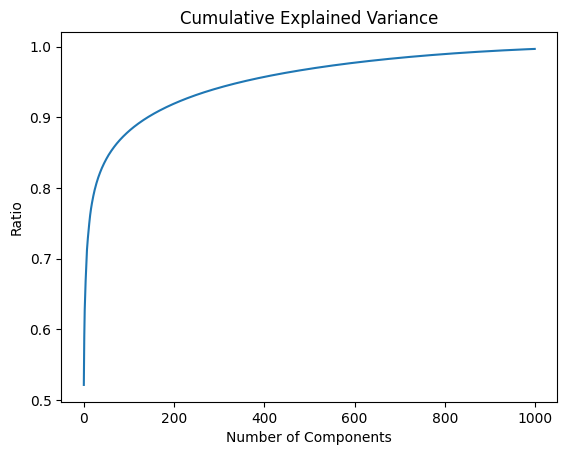

In [3]:
import matplotlib.pyplot as plt
%matplotlib inline

# calculate the cumulative sum of explained variance ratio
explained_variance = np.cumsum(svd.explained_variance_ratio_)

# plot the variance
plt.plot(explained_variance)
plt.title("Cumulative Explained Variance")
plt.xlabel("Number of Components")
plt.ylabel("Ratio")
plt.show()

We see that 90% can already explain the variance quite well. I will compute the explained variance for 95%, 99% and 100% to see the real values.

In [4]:
# number of components to explain 95% variance
n_components_95 = len(explained_variance[explained_variance <= 0.95])

# number of components to explain 99% variance
n_components_99 = len(explained_variance[explained_variance <= 0.99])

# number of components to explain 99% variance
n_components_100 = len(explained_variance[explained_variance <= 1])

print(f"Number of components to explain 95% variance: {n_components_95}")
print(f"Number of components to explain 99% variance: {n_components_99}")
print(f"Number of components to explain 100% variance: {n_components_100}")

Number of components to explain 95% variance: 350
Number of components to explain 99% variance: 812
Number of components to explain 100% variance: 1000


We observe that 350 components can already explain 95% of the variance. Therefore, I will configure my TruncatedSVD with 350 components. This will reduce computing time and should not significantly degrade the accuracy.

In [5]:
# Set up TruncatedSVD        # 350 components can explain 95%
svd = TruncatedSVD(n_iter=5, n_components=350, random_state=0) 
# fit and transforme 
transformed_images = svd.fit_transform(np_img)

### Computing the distance of each transormed image by using the euclidean distance form the average image 

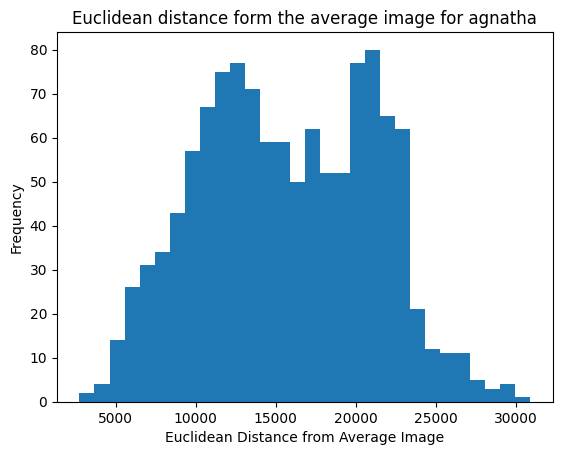

In [6]:
# Compute the average image of the transformed image
mean_img = np.mean(transformed_images, axis=0)

# Computing the distance euclidean distance form the average image 
distances = []
for img in transformed_images:
    dist = distance.euclidean(img, mean_img)
    distances.append(dist)

# Plot histogram
plt.hist(distances, bins=30)
plt.title("Euclidean distance form the average image for agnatha")
plt.xlabel("Euclidean Distance from Average Image")
plt.ylabel("Frequency")
plt.show()

The goal here is to remove only irrelevant images. Just to be on the safe side. I will compute the 99% percentile of the distance. Which will enable me to set a threshold and distinguish images that are furthest from the average image according to the Euclidean distance.

In [7]:
# Compute the 99th percentiles
upper_threshold = np.percentile(distances, 99)

# Determine outlier
outliers = [image_path for image_path, dist in zip(image_paths, distances) if dist > upper_threshold]

print("Number of possible outliers:", len(outliers))

Number of possible outliers: 12


Displaying the first 5 images found

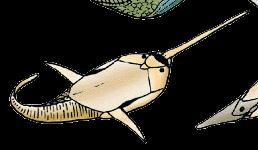

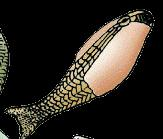

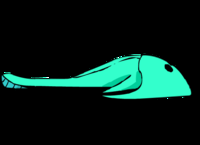

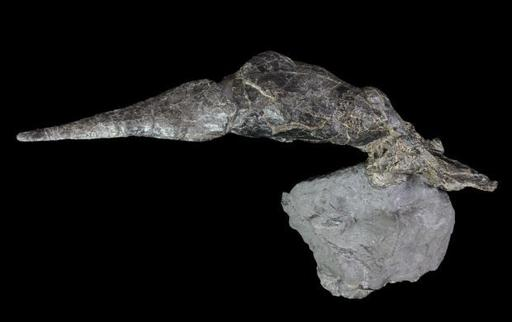

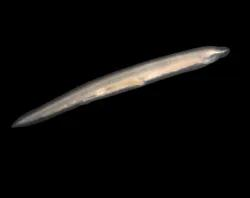

In [8]:
# Display irrelevant images detected
for i, path in enumerate(outliers[:5]):
    display(Image.open(path))

My solution is not the best, but it often finds close-to-optimal results. I assume these images are irrelevant or anomalies. However, it's possible that this isn't the case, and some of these images are very important to keep (e.g., image 4). This is why I will not proceed further with this method, the results are too random.

###  Now I will try with high-level features and unsupervised machine learning (cluster).
The goal is to use the silhouette score for each cluster to identify images that are below the average silhouette score and consider them as outliers.

__This method is based on the assumption that:__
- Images that are well-grouped (i.e., have a high silhouette score) are very likely fossils
- Images that are not well-grouped (i.e., have a silhouette score below the average) could be outliers.

Steps:

1. Load the images from the appropriate directory. This is done to keep only the class I'm interested in.
2. Extract high-level features from the images using a pretrained CNN model. I will use <a href="https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4"> MobileNet v2 </a> , which is known for its speed and efficiency.
3. Set up a dimensionality reduction to improve clustering and outliers detection performance. I will use Principal Component Analysis (PCA) to reduce the dimensionality of my high-level features.
4. Set up K-Means clustering for each class and tune the ``n_clusters`` parameter to determine the optimal number of clusters for each class.
5. Plotting the first two components after fitting K-Means clustering to provide insights into how my dataset is distributed and how the clusters are formed.
6. Compute the silhouette score for each clustering result to evaluate the quality of the clusters.
7. Identify outlier images using the silhouette score. The silhouette score measures how similar a feature set is to its own cluster compared to other clusters. Images with silhouette scores less than the average silhouette score are likely outliers, suggesting they won't fit well within any specific cluster.
8. Display the outlier images that were identified in ``agnatha`` category.
9. Discuss results.

Please note: It will be hard to detect all irrelevant images and I'm not sure the clustering method will work.

## Load the images 

I will manually read, convert, resize and normalize pixel values.  

I'm using ``lanczos`` to apply a high-quality filter to improve both upsampling (increasing resolution) and downsampling (decreasing resolution) of images. 

In [9]:
import tensorflow as tf 

# Directory path
dir_path = "data/reduced-FID/reduced-FID/agnatha"


# Initialize empty list to store images and labels
images = []
image_paths = []

# Get the list of all files in the directory
all_file = os.listdir(dir_path)

for file_name in all_file:
    image_path = os.path.join(dir_path, file_name)
    # Save image path
    image_paths.append(image_path)
    # Open image
    with Image.open(image_path) as img:
        # Convert to RGB
        img = img.convert("RGB")
        # Resize the image using "LANCZOS" resampling filter
        img = img.resize((224, 224), Image.LANCZOS) 
        # Normalize pixel values and convert to float32
        np_img = np.array(img, dtype=np.float32) / 255 # Normalize pixel values
        
        # Add the image and label to the respective lists
        images.append(np_img)

# Convert lists to numpy arrays
images = np.array(images, dtype=np.float32)

# 0 is the label of the fist class in this case "agnatha"
labels = np.zeros(len(images))

# Convert the image to a TensorFlow tensor
image_tensor = tf.convert_to_tensor(images, dtype=tf.float32)

In [10]:
print("Number of image and size:", images.shape)
print("Number of labels:", labels.shape)

Number of image and size: (1187, 224, 224, 3)
Number of labels: (1187,)


We have a large batch of images loaded in the memory, it doesn't hurt the performance when extracting high-level features.

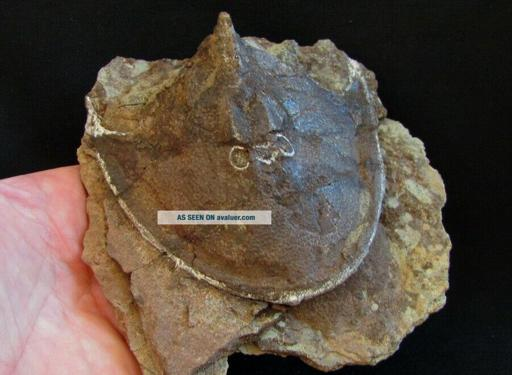

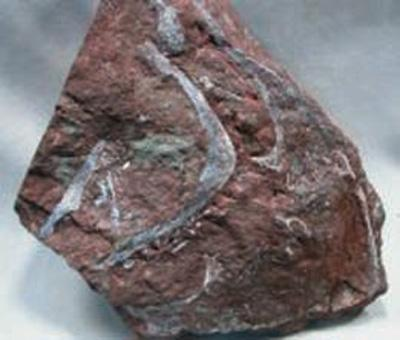

In [11]:
# Disply the first two images

for img_path in image_paths[:2]:
    with Image.open(img_path) as img:
        display(img)
    

## Extract the high-level features

I will use the ``MobileNetV2`` pretrained model to extract high-level features using the ``pooling="avg"`` argument, which applies a global average pooling at the end.

In [12]:
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2

# Load MobileNetV2 pretrained model
base_model = MobileNetV2(
    weights="imagenet",
    input_shape=(224, 224, 3),
    include_top=False, # Do not include the ImageNet classifier at the top.
    pooling="avg", # This means that global average pooling will be applied to the output of the last convolutional layer, 
                   # and thus the output of the model will be a 2D tensor.
)

# Make the base model non-trainable
base_model.trainable = False

# Extract features 
features = base_model.predict(image_tensor)

print("features extracted shape:", features.shape)

38/38 [==============================] - 5s 32ms/step
features extracted shape: (1187, 1280)


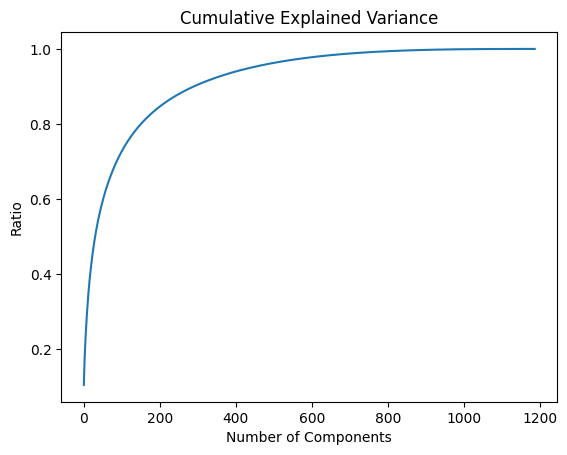

In [13]:
from sklearn.decomposition import PCA

# Fit a PCA model
pca = PCA(n_components=None, random_state=0)
pca.fit(features)

# Get the explained variance ratios for each component
explained_variances = pca.explained_variance_ratio_

# Calculate the cumulative sum of the explained variance ratios
cumulative_variances = np.cumsum(explained_variances)


# Plot the cumultive axplained variance ratios
plt.plot(cumulative_variances)
plt.title("Cumulative Explained Variance")
plt.xlabel("Number of Components")
plt.ylabel("Ratio")
plt.show()

Eight hundred components can already explain petty much 100%. after this point we start to stagnating. I will compute the explained variance for 95%, 99% and 100% to see the real values.

In [14]:
# number of components to explain 95% variance
n_components_95 = len(explained_variance[explained_variance <= 0.95])

# number of components to explain 99% variance
n_components_99 = len(explained_variance[explained_variance <= 0.99])

# number of components to explain 99% variance
n_components_100 = len(explained_variance[explained_variance <= 1])

print(f"Number of components to explain 95% variance: {n_components_95}")
print(f"Number of components to explain 99% variance: {n_components_99}")
print(f"Number of components to explain 100% variance: {n_components_100}")

Number of components to explain 95% variance: 350
Number of components to explain 99% variance: 812
Number of components to explain 100% variance: 1000


Retaining 99% of the variance provide a good balance between preserving a large proportion of the information and allowing me to work with a lower-dimensional representation of the data.
 

I will set the ``n_components`` to ``0.99``, PCA will automatically determine the number of principal components needed to explain the 99% of the variance. 

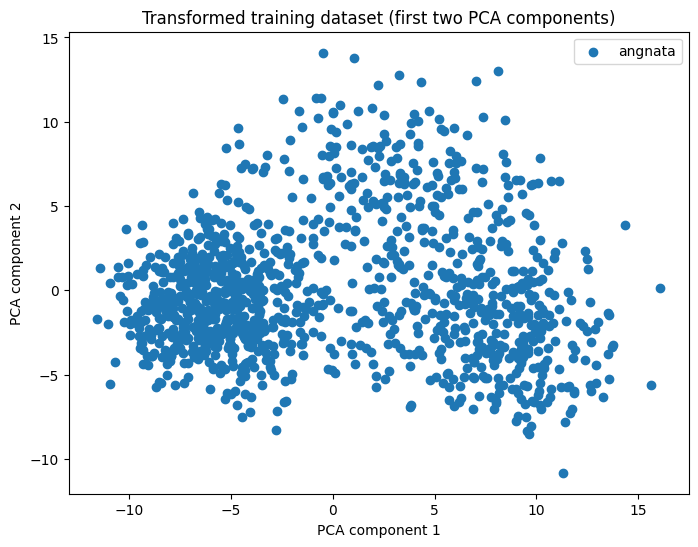

In [15]:
# Transform the training dataset using the first two PCA components
pca = PCA(n_components=0.99, random_state=0)
features_transformed = pca.fit_transform(features)

# Plot the transformed dataset
plt.figure(figsize=(8, 6))

plt.scatter(features_transformed[:, 0], features_transformed[:, 1], label="angnata")
plt.legend()
plt.title("Transformed training dataset (first two PCA components)")
plt.xlabel("PCA component 1")
plt.ylabel("PCA component 2")
plt.show()

# Determining the best number of clusters 
To help me decide on the best number of clusters. I will use the Yellowbrick library that implements the Elblow Method. It enables me to fit a range of clusters and provide a handy plot where the best fit is annotated with dashed lines.

The scoring parameter ``metric`` to evaluate the quality of clusters.
- The default setting is ``distortion``: Mean sum of squared distances to centers
- ``silhouette``: Mean ratio of intra-cluster and nearest-cluster distance
- ``calinski_harabasz``: Ratio of dispersion between and within clusters

I will use the three different scoring methods and take the average result as my optimal number of clusters. 


Source:

<a href="https://towardsdatascience.com/cheat-sheet-to-implementing-7-methods-for-selecting-optimal-number-of-clusters-in-python-898241e1d6ad#:~:text=our%20K%20means.-,Elbow%20Method,WSS%20first%20starts%20to%20diminish">Elbow Method explained</a>

<a href="https://www.scikit-yb.org/en/latest/api/cluster/elbow.html">Elbow Method docs</a>

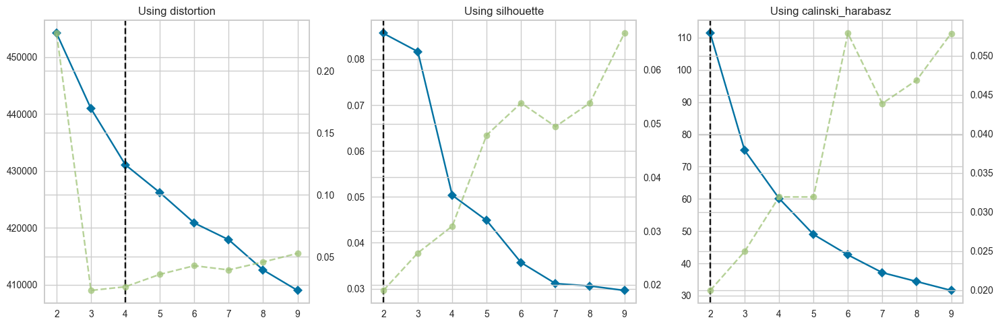

In [16]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer


# k is range of number of clusters
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Distortion metric
knn_distortion = KMeans(n_init="auto", random_state=0)
visualizer_distortion = KElbowVisualizer(knn_distortion, k=(2, 10), metric="distortion", ax=axs[0], timings=True)
visualizer_distortion.fit(features_transformed)
axs[0].set_title("Using distortion")

# Silhouette metric
knn_silhouette = KMeans(n_init="auto", random_state=0)
visualizer_silhouette = KElbowVisualizer(knn_silhouette, k=(2, 10), metric="silhouette", ax=axs[1], timings=True)
visualizer_silhouette.fit(features_transformed)
axs[1].set_title("Using silhouette")

# Calinski-Harabasz metric
knn_calinski = KMeans(n_init="auto", random_state=0)
visualizer_calinski = KElbowVisualizer(knn_calinski, k=(2, 10), metric="calinski_harabasz", ax=axs[2], timings=True)
visualizer_calinski.fit(features_transformed)
axs[2].set_title("Using calinski_harabasz")


plt.tight_layout()
plt.show()

The average number of cluster is 2. 

In [17]:
# Reset matplotlib to default settings
plt.rcdefaults()

###  Fit K-Means clustering

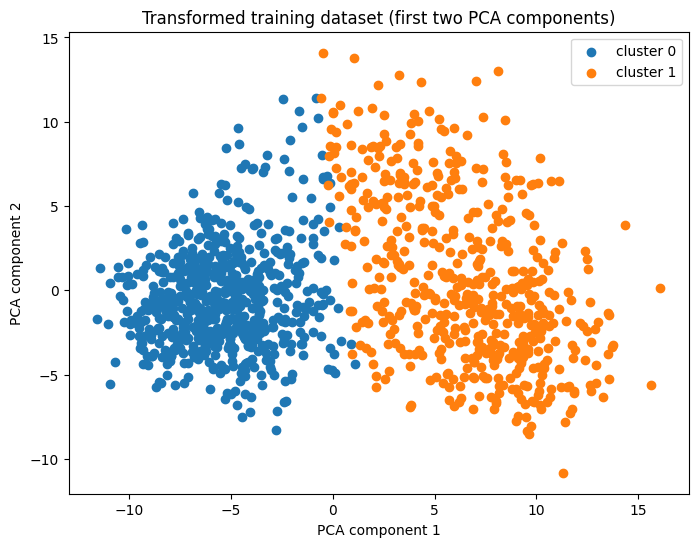

In [18]:
# Set numb of clusters
n_clusters = 2

# Fit K-Means clustering
kmeans = KMeans(n_init="auto", n_clusters=n_clusters, random_state=0)
kmeans.fit(features_transformed)

# Plot the transformed dataset
plt.figure(figsize=(8, 6))
for i in range(n_clusters):
    plt.scatter(features_transformed[kmeans.labels_ == i, 0], features_transformed[kmeans.labels_ == i, 1], label= "cluster " + str(i))
plt.legend()
plt.title("Transformed training dataset (first two PCA components)")
plt.xlabel("PCA component 1")
plt.ylabel("PCA component 2")
plt.show()

### Compute silhouette scores and the average silhouette scores

I calculate the silhouette score for each set of extracted features and then determine the average of these scores. This process assesses how closely a set of features aligns with its assigned cluster. By using the average silhouette score as a threshold, we can detect cases where features might be incorrectly assigned to the wrong cluster, potentially indicating that the corresponding image is an outlier.

In [19]:
from sklearn.metrics import silhouette_samples, silhouette_score

# Compute silhouette scores for each sample
silhouette_scores = silhouette_samples(features_transformed, kmeans.labels_)

# Compute the average silhouette scores
avg_silhouette_scores = silhouette_score(features_transformed, kmeans.labels_)

# Silhouette scores less than the average silhouette score are probably outliers
outlier_images = images[silhouette_scores < avg_silhouette_scores]
print("Number of possible irrelevant images:", outlier_images.shape[0])

Number of possible irrelevant images: 538


### Plot the Distribution of Silhouette Scores

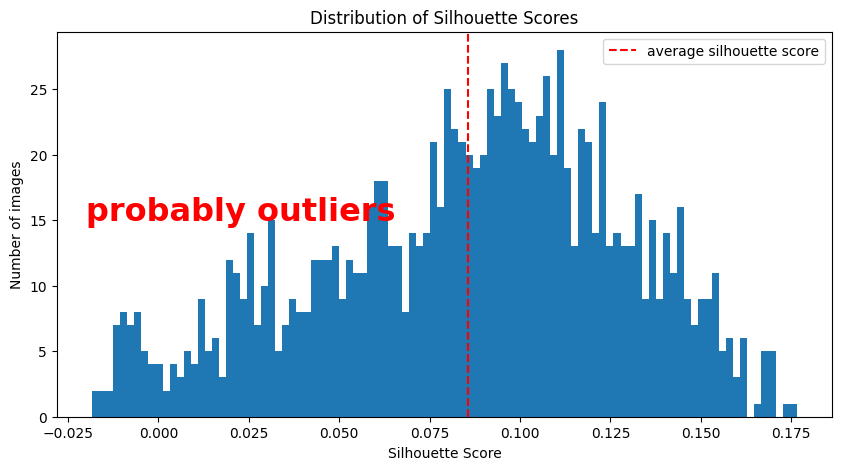

In [20]:
# Plot
plt.figure(figsize=(10, 5))
plt.hist(silhouette_scores, bins=100)
plt.axvline(avg_silhouette_scores, color="red", linestyle="--", label="average silhouette score")
plt.title("Distribution of Silhouette Scores")
plt.xlabel("Silhouette Score")
plt.ylabel("Number of images")

# Add text 
plt.text(
        -0.020, 15, "probably outliers",
        fontsize=23,
        fontweight="bold",
        color="red",
        
    )

plt.legend()
plt.show()

Just using the average silhouette score as the threshold is too large. It's difficult to reliably classify image just by using cluster and their silhouette scores alone. Even if I set a costume threshold, I will end up with false positive. I need a more precise solution this method isn't reliable. 

Just to visualise the possible irrelevant images. I will display the first 60 images.


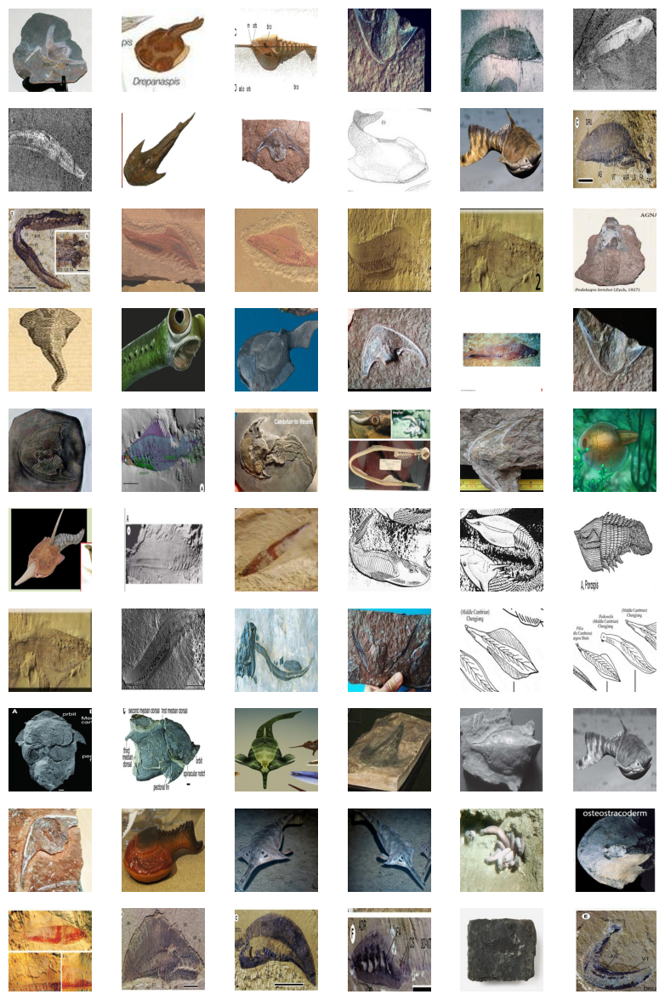

In [21]:
fig, ax = plt.subplots(10 ,6, figsize=(10, 15))
ax = ax.flatten()

for i in range(60):
    img = outlier_images[i:i+1]
    ax[i].imshow(img[0])
    ax[i].axis("off")
plt.show()

Indeed, we can't classify correctly just by using clusters. It's just too complex and the difference between a fossil and non-fossil is really hard to distinguish.  

Next, I will try with deep learning. 

### Deep learning

The goal is to use deep learning to classify fossils. By doing so, I can use the probability generated by my model to determine if the images are fossils (0) or not fossils (1), thereby removing them.

I plan to fine-tune the pretrained model and train a custom classifier on top of it. By doing so, the model should adapt better to my fossil images, potentially resulting in improved accuracy.

>**Note**: This task is computationally intense, and having access to a GPU is recommended. The code provided below might take a long time to run.


To fine-tune my model, I will use the functional API from Keras. This enables me to freeze layers and train the layers above that. The reason for this approach is that the earlier layers in the pretrained model capture more general features that could be beneficial for my dataset. On the other hand, the later layers are more specialized to the original ImageNet task and might require adaptation to better suit my fossil images.

Steps:
1. Create a dataset with images of  fossils and image of non-fossil. This dataset was created by hand to ensure images are placed in the correct category. 
2. Split the dataset over a train (70%), validation set (15%) and a test set (15%).
3. Load the images using ``ImageDataGenerator`` and  the labels will be numerically encoded using to ``class_mode`` to ``"sparse"``.
4. Set up deep learning methods and fine-tune it using the functional API from Keras.



### Loading the data and split it

>Please download the fossil-vs-non-fossil dataset from my Google Drive: [dataset](https://drive.google.com/file/d/1PDpBdpD7_4jHZIcRFQBYatoU4Jy9Dhj1/view?usp=sharing)

In [22]:
# Code to extract a zip
import zipfile


def extract_zip(zip_file_path, extract_path):
    with zipfile.ZipFile(zip_file_path, "r") as zipf:
        zipf.extractall(extract_path)


zip_file_path = "data/fossil-vs-non-fossil.zip"
extract_path = "data/fossil-vs-non-fossil"
extract_zip(zip_file_path, extract_path)

Number of categories: 2
Number of images: 11464


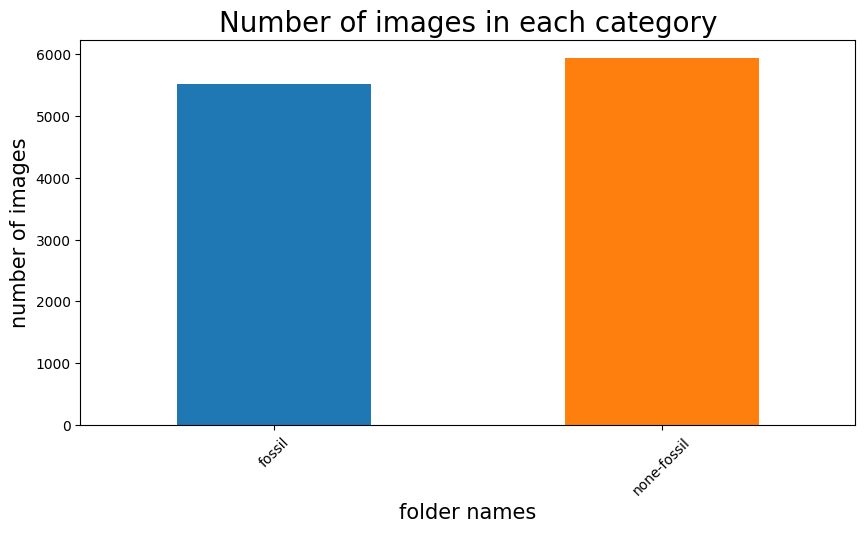

In [23]:
dir_path = "data/fossil-vs-non-fossil/fossil-vs-non-fossil"


# Initialise empty dictionary and list
img_count = {}

# Loop over all subfolders in the directory
for subfolder_name in os.listdir(dir_path):

    # Get the full path to the subfolder
    subfolder_path = os.path.join(dir_path, subfolder_name)

    if os.path.isdir(subfolder_path):
        
        # Save number of images and class name
        img_count[subfolder_name] = len(os.listdir(subfolder_path))

        
print("Number of categories:", len(img_count))
print("Number of images:", sum(img_count.values()))


# Create a dictionary of kwargs
xlim_kwargs = {"left": -0.5, "right": (len(img_count) - 1) + 0.5}

# Plot the images in each folder
plt.figure(figsize=(10, 5))
for f in img_count:
    plt.bar(f, img_count.get(f), width=0.5)
plt.xlim(**xlim_kwargs)
plt.xticks(rotation=45)
plt.title("Number of images in each category", fontsize=20)
plt.xlabel("folder names", fontsize=15)
plt.ylabel("number of images", fontsize=15)
plt.show()

We have slightly more non-fossil than fossil, it shouldn't impact our model.

In [24]:
import splitfolders

# Spilt the dataset in train, validation and test set

# Splits the dataset
splitfolders.ratio("data/fossil-vs-non-fossil/fossil-vs-non-fossil", output="data/fossil-vs-non-fossil-splited", seed=0, ratio=(.7, .15, .15))

I'm using ``"lanczos"`` for image resampling, which offers superior sharpness and minimal artifacts but is slower.

To help mitigate the risk of overfitting, I'm using data augmentation. This will encourage the model to learn more general features from the data.

In [25]:
from keras.preprocessing.image import ImageDataGenerator

folder_name = "data/fossil-vs-non-fossil-splited"



# Define aggressive data augmentation settings
train_datagen = ImageDataGenerator(
                                    rescale=1./255,
                                    rotation_range=30,              # Increased rotation range
                                    width_shift_range=0.2,
                                    height_shift_range=0.2,
                                    shear_range=0.3,                # Increased shear range
                                    zoom_range=0.3,                 # Increased zoom range
                                    horizontal_flip=False,           # Enable horizontal flipping
                                    vertical_flip=False,           
                                    fill_mode="constant",
                                )


train_set = train_datagen.flow_from_directory(
        os.path.join(folder_name, "train"),
        target_size=(224, 224),
        interpolation="lanczos",
        shuffle=True,
        batch_size=64,
        class_mode="sparse",
        )


# For valid/test sets just rescaling the images to normelize them [0, 1]
datagen = ImageDataGenerator(rescale=1./255)

valid_set = datagen.flow_from_directory(
        os.path.join(folder_name, "val"),
        target_size=(224, 224),
        interpolation="lanczos",
        shuffle=False,
        batch_size=64,
        class_mode="sparse",
        )

test_set = datagen.flow_from_directory(
        os.path.join(folder_name, "test"),
        target_size=(224, 224),
        interpolation="lanczos",
        shuffle=False,
        batch_size=64,
        class_mode="sparse",
        )

Found 8024 images belonging to 2 classes.
Found 1718 images belonging to 2 classes.
Found 1722 images belonging to 2 classes.


### Visualize the augmented images generated 

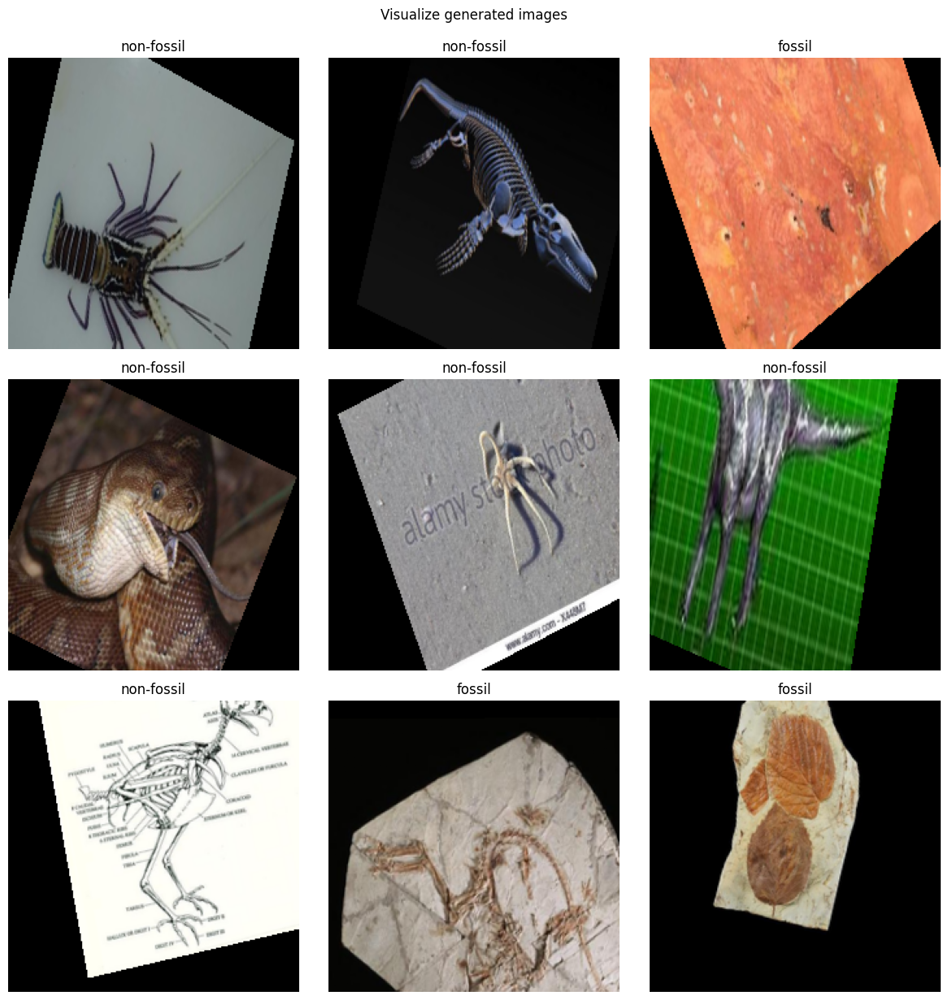

In [26]:
# Retrieve a batch of images
X_batch, y_batch = next(train_set)

# Create a dictionary to map labels to their corresponding string representation
non_vs_fossil = {
    0.0 : "fossil",
    1.0 : "non-fossil"
}

# Plot the images

fig, axes =  plt.subplots(3, 3, figsize=(12, 12))
ax = axes.flatten()

for i in range(9):  # Adjust this value to show more or fewer image
    ax[i].imshow(X_batch[i])
    ax[i].axis("off") 
    ax[i].set_title(non_vs_fossil.get(y_batch[i])) # Set title of the subplot based on the label

plt.tight_layout()
plt.suptitle("Visualize generated images", y=1.02) 
plt.show()

### Train the model

>Please note that the model below isn't 100% reproducible. Even when setting seed numbers or using TensorFlow's deterministic operations, the model may produce different results on different hardware. 

In [27]:
# Clear the previous model.
tf.keras.backend.clear_session()

In [28]:
import tensorflow.keras as keras
import random

# Set seeds for reproducibility
np.random.seed(0)
random.seed(0)
tf.random.set_seed(0)

# If you're using TensorFlow with GPU, setting deterministic operations
os.environ['TF_DETERMINISTIC_OPS'] = '1'


# Load the pretrained model
base_model = MobileNetV2(input_shape=(224, 224, 3), weights="imagenet", include_top=False)

# Get the number of layers for the base_model
print(f"The base_model has {len(base_model.layers)} layers.") 

# Make layers of the base model trainable
base_model.trainable = True

# Unfreeze the last few layers for fine-tuning
fine_tune_at = 150

# Freezes the weights of the pre-train model
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

# Creat a new classification layers on top
x = base_model.output
x = keras.layers.GlobalAveragePooling2D()(x)
x = keras.layers.Dense(1024, activation="relu")(x)
outputs = keras.layers.Dense(train_set.num_classes, activation="softmax")(x)

# Define the model
model = keras.Model(inputs=base_model.input, outputs=outputs)

# Compile the model
model.compile(optimizer=keras.optimizers.Adam(1e-3), loss="sparse_categorical_crossentropy", metrics=["acc"])

# Print network summary
model.summary()

The base_model has 154 layers.
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                              

In [29]:
# Code to load the best-model-fossil-vs-non.h5 if needed

""" # Recreate the exact same model, including its weights and the optimizer
model = tensorflow.keras.models.load_model("best-model-fossil-vs-non.h5")

# Show the model architecture
model.summary() """

' # Recreate the exact same model, including its weights and the optimizer\nmodel = tensorflow.keras.models.load_model("best-model-fossil-vs-non.h5")\n\n# Show the model architecture\nmodel.summary() '

In [30]:
### Code to train the model

from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint

# End trainging whe accuracy stops improving
early_stopping = EarlyStopping(monitor="val_loss", patience=20)

# Reduce learning rate if val_loss doesn't improve
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.2,
                              patience=3, min_lr=1e-10)

# Define model checkpoint
checkpoint = ModelCheckpoint("best-model-fossil-vs-non.h5", monitor="val_loss", verbose=1, save_best_only=True, mode="min")

# Fit model
history = model.fit(
    train_set,
    validation_data=valid_set,
    epochs=200,
    callbacks=[checkpoint, early_stopping, reduce_lr],
    verbose=1,
    workers=4, # Number of workers Depend on your configuration
)

Epoch 1/200
126/126 [==============================] - ETA: 0s - loss: 0.3310 - acc: 0.8767
Epoch 1: val_loss improved from inf to 0.29974, saving model to best-model-fossil-vs-non.h5
126/126 [==============================] - 31s 215ms/step - loss: 0.3310 - acc: 0.8767 - val_loss: 0.2997 - val_acc: 0.8923 - lr: 0.0010
Epoch 2/200
126/126 [==============================] - ETA: 0s - loss: 0.2079 - acc: 0.9160
Epoch 2: val_loss improved from 0.29974 to 0.21694, saving model to best-model-fossil-vs-non.h5
126/126 [==============================] - 26s 205ms/step - loss: 0.2079 - acc: 0.9160 - val_loss: 0.2169 - val_acc: 0.9162 - lr: 0.0010
Epoch 3/200
126/126 [==============================] - ETA: 0s - loss: 0.1792 - acc: 0.9300
Epoch 3: val_loss improved from 0.21694 to 0.18311, saving model to best-model-fossil-vs-non.h5
126/126 [==============================] - 26s 201ms/step - loss: 0.1792 - acc: 0.9300 - val_loss: 0.1831 - val_acc: 0.9255 - lr: 0.0010
Epoch 4/200
126/126 [========

In [31]:
# Save model 
model.save("remove-irrelevant-img-model.h5")

In [32]:
(test_loss, test_accuracy) = model.evaluate(test_set)

print("Test loss: {:.2f}".format(test_loss))
print("Test accuracy: {:.2f}%".format(100 * test_accuracy))

27/27 [==============================] - 7s 262ms/step - loss: 0.2890 - acc: 0.9321
Test loss: 0.29
Test accuracy: 93.21%


The accuracy of the test set is good. Next I will plot Confusion Matrix.

27/27 [==============================] - 6s 214ms/step


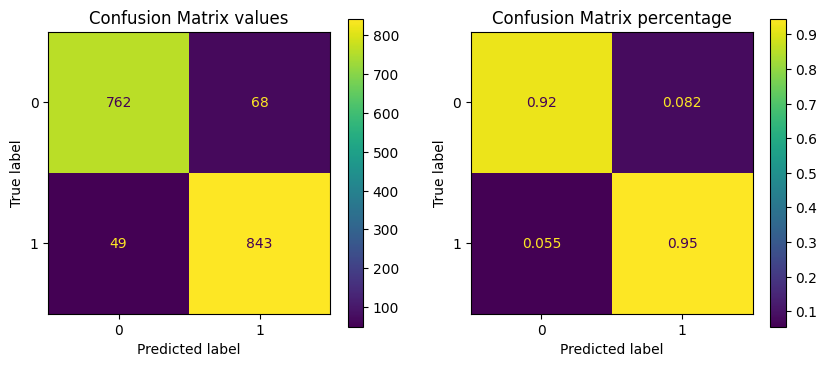

In [33]:
from sklearn.metrics import ConfusionMatrixDisplay

test_pred = model.predict(test_set)

# Compute the heigths probability for each entry
test_pred_labels = np.argmax(test_pred, axis=1)


# Plot Confusion Matrix
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(10, 4))

ConfusionMatrixDisplay.from_predictions(test_set.labels, test_pred_labels, ax=ax0)
ax0.set_title("Confusion Matrix values")

ConfusionMatrixDisplay.from_predictions(test_set.labels, test_pred_labels, normalize="true", ax=ax1)
ax1.set_title("Confusion Matrix percentage")

plt.show()

In general, the model appears to be slightly more inclined to misclassify fossils than non-fossils. However, the difference isn't significant.

### Plot accuracy and loss metrics for both training and validation data

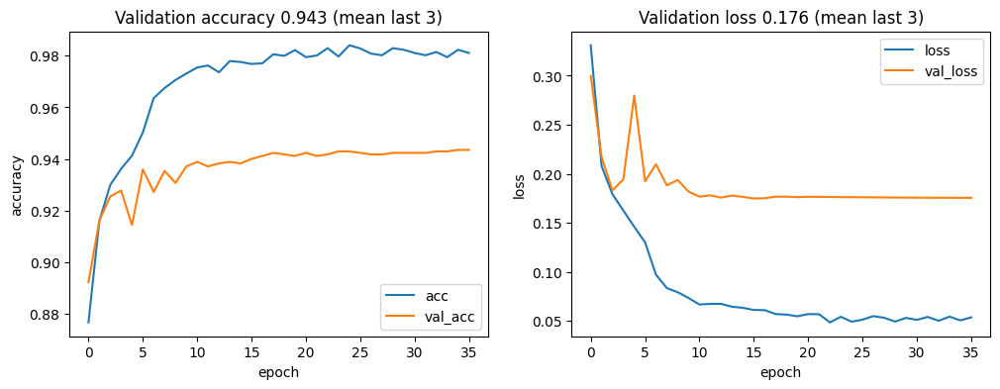

In [34]:
import pandas as pd

# Plots neural network performance metrics for train and validation
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

# Get the performance metrics
results = pd.DataFrame(history.history)

# Plot accuracy curves
results[["acc", "val_acc"]].plot(ax=ax1)
ax1.set_title(
    "Validation accuracy {:.3f} (mean last 3)".format(
        np.mean(results["val_acc"][-3:]) # Last three values
    )
)
ax1.set_xlabel("epoch")
ax1.set_ylabel("accuracy")

# Plot loss curves
results[["loss", "val_loss"]].plot(ax=ax2)
ax2.set_title(
    "Validation loss {:.3f} (mean last 3)".format(
        np.mean(results["val_loss"][-3:]) # Last three values
    )
)
ax2.set_xlabel("epoch")
ax2.set_ylabel("loss")

plt.show()

We see that the training loss decreases while the validation loss stagnates. For accuracy, the training accuracy increases while the validation accuracy remains stagnant. These are signs that our model is overfitting. Our model learns the training data too well. However, when testing the model, we achieved good results. So, I will not attempt to further improve the model.

### I will use my model on the  agnatha category of the reduced-FID dataset and see the results.

In [35]:
# Compute the prediction
predictions = model.predict(image_tensor)

38/38 [==============================] - 2s 35ms/step


In [36]:
# Initialize empty lists
path_fossil_img_agnatha = []
path_non_fossil_img_agnatha = []

# Take the index of the maximum value from prediction array for each image
max_pred = np.argmax(predictions, axis=1)

# Check if each image is classified as fossil or non-fossil and 
# append its path to the corresponding list
for i, path in enumerate(image_paths):
    # Check if each image is classified as fossil or non-fossil and 
    # append its path to the corresponding list
    if max_pred[i] == 0: 
        path_fossil_img_agnatha.append(path)
    # If the image is classified as non-fossil
    else: 
        path_non_fossil_img_agnatha.append(path)

print("Number of fossils:", len(path_fossil_img_agnatha))
print("Number of non fossils: ", len(path_non_fossil_img_agnatha))

Number of fossils: 557
Number of non fossils:  630


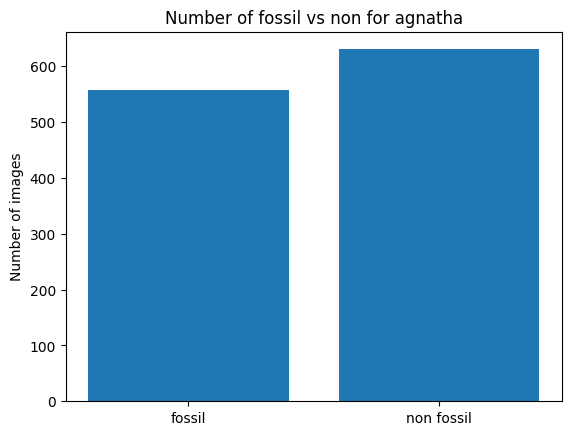

In [37]:
pred_number = [len(path_fossil_img_agnatha), len(path_non_fossil_img_agnatha)]

plt.bar(["fossil", "non fossil"], pred_number)
plt.title("Number of fossil vs non for agnatha")
plt.ylabel("Number of images")
plt.show()

More than half of the Agnatha images are irrelevant, let's visualize them.

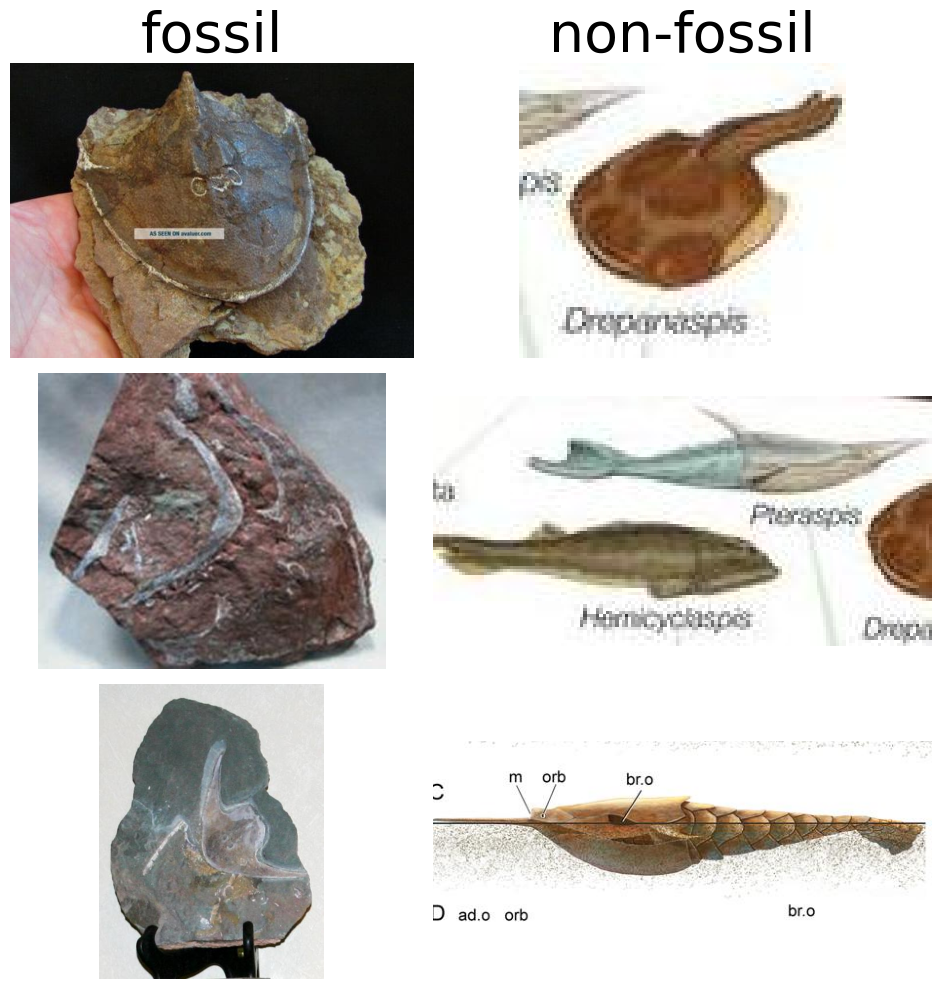

In [38]:
# Display some image of fossil vs non
fig, ax = plt.subplots(3, 2, figsize=(10, 10))

# image 1
ax[0, 0].imshow(Image.open(path_fossil_img_agnatha[0]))
ax[0, 0].set_title("fossil", fontsize = 40)
ax[0, 0].axis("off")
# image 2
ax[0, 1].imshow(Image.open(path_non_fossil_img_agnatha[0]))
ax[0, 1].set_title("non-fossil", fontsize = 40)
ax[0, 1].axis("off")
# image 3
ax[1, 0].imshow(Image.open(path_fossil_img_agnatha[1]))
ax[1, 0].axis("off")
# image 4
ax[1, 1].imshow(Image.open(path_non_fossil_img_agnatha[1]))
ax[1, 1].axis("off")
# image 5
ax[2, 0].imshow(Image.open(path_fossil_img_agnatha[2]))
ax[2, 0].axis("off")
# image 6
ax[2, 1].imshow(Image.open(path_non_fossil_img_agnatha[2]))
ax[2, 1].axis("off")

plt.tight_layout()
plt.show()


The model is quite good at distinguishing between non-fossil and fossil.

# Applying the same procedure to the entire reduced-FID dataset 

In [39]:
directory_path = "data/reduced-FID/reduced-FID"

data_gen = ImageDataGenerator(rescale=1./255)

data = data_gen.flow_from_directory(
    directory_path,
    target_size=(224, 224), 
    shuffle=False,
    interpolation="lanczos",
    batch_size=32,
    class_mode=None, #  no labels are returned
)

print("Number of batches: ", len(data))

Found 54196 images belonging to 46 classes.
Number of batches:  1694


### Predicting fossil presence in the reduced-FID Dataset

In [40]:
# Compute the prediction 
pred = model.predict(data)


# Take the index of the maximum value from prediction array for each image
max_pred = np.argmax(pred, axis=1)

1694/1694 [==============================] - 192s 113ms/step


### Next, I check if each image is classified as fossil or non-fossil and I append its path to the corresponding list

In [41]:
# Initialize empty lists
path_fossil_img = []
path_non_fossil_img = []

# Check if each image is classified as fossil or non-fossil and 
# append its path to the corresponding list
for i, path in enumerate(data.filenames):
    # If the images is classified as fossil
    if max_pred[i] == 0.: 
        path_fossil_img.append(path)
    # If the image is classified as non-fossil
    else: 
        path_non_fossil_img.append(path)

print("Number of fossils:", len(path_fossil_img))
print("Number of non fossils: ", len(path_non_fossil_img))

Number of fossils: 40451
Number of non fossils:  13745


### Display some non-fossil images

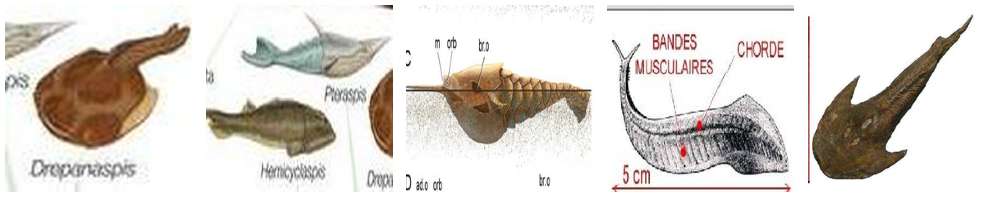

In [42]:
# Function to load image and resize
def open_image(path):
    with Image.open(path) as img:
        # Resize image
        img = img.resize((224, 224), resample= Image.LANCZOS) 
        return img

# Initialize a figure to plot the images
fig, axes = plt.subplots(1, 5, figsize=(20, 4))

for ax, path in zip(axes, path_non_fossil_img[:5]):
    # Open and display each image
    img_path = os.path.join(directory_path, path)
    img = open_image(img_path)
    ax.imshow(img)
    ax.axis('off')

plt.tight_layout()
plt.show()

### Now I will copy the entire directory reduced-FID (just to keep the initial database untouched). Next I will remove all non-fossil images in ``reduced-FID-cleaned``. 

In [43]:
import shutil

# Copy the directory and rename it

# Copy the entire source directory to destination directory
shutil.copytree(directory_path, "data/reduced-FID-cleaned")

# Remove non-fossils images
for path in path_non_fossil_img:
    img_path = os.path.join("data/reduced-FID-cleaned", path)
    if os.path.exists(img_path):
        os.remove(img_path)
    else:
        print(f"Path {img_path} couldn't be found")

### Removing remaining irrelevant images
These paths represent irrelevant images I found during my dataset review, and I will remove them. For instance, the first two images in the ``'agnatha'`` category are both representations of fossils.

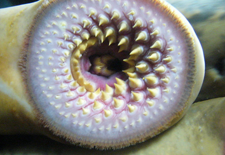
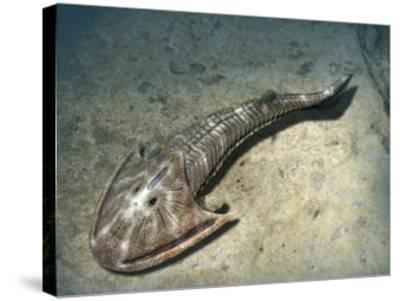

In [44]:
# Removing remaing outliers
img_to_remove = ["data/reduced-FID-cleaned/agnatha/agnatha_145.png", "data/reduced-FID-cleaned/agnatha/agnatha_215.jpg", 
                "data/reduced-FID-cleaned/amphibian/amphibian_297.jpg", "data/reduced-FID-cleaned/crocodylomorph/crocodylomorph_219.jpg", 
                "data/reduced-FID-cleaned/insect/insect_92.jpg", "data/reduced-FID-cleaned/myriapod/myriapod_171.jpg", "data/reduced-FID-cleaned/myriapod/myriapod_189.jpg", 
                "data/reduced-FID-cleaned/myriapod/myriapod_220.jpg", "data/reduced-FID-cleaned/myriapod/myriapod_342.jpg", "data/reduced-FID-cleaned/ornithischian/ornithischian_658.jpg",
                "data/reduced-FID-cleaned/placoderms/placoderms_58.jpg", "data/reduced-FID-cleaned/pterosaurs/pterosaurs_202.jpg", 
                "data/reduced-FID-cleaned/pterosaurs/pterosaurs_316.jpg", "data/reduced-FID-cleaned/pterosaurs/pterosaurs_628.jpg", "data/reduced-FID-cleaned/pterosaurs/pterosaurs_1047.jpg",
                "data/reduced-FID-cleaned/snake/snake_31.jpg", "data/reduced-FID-cleaned/turtle/turtle_23.jpg"] 

for path in img_to_remove:
    # Check if the path exists. If true we remove it
    if os.path.exists(path):
        os.remove(path)
    else:
        """ print(f"path to check {path}") """

### Visualizing the number of images in each category

Number of categories: 46
Number of images: 40447


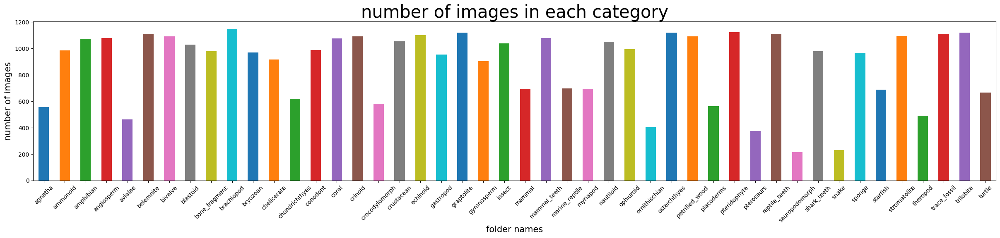

In [ ]:
dir_path = "data/reduced-FID-cleaned"


# Initialise empty dictionary and list
img_paths = {}
img_count = {}


# Loop over all subfolders in the directory
for subfolder_name in os.listdir(dir_path):

    # Get the full path to the subfolder
    subfolder_path = os.path.join(dir_path, subfolder_name)

    if os.path.isdir(subfolder_path):
        
        # Save number of images and class name
        img_count[subfolder_name] = len(os.listdir(subfolder_path))
        
        # Initialise the key with an empty list
        img_paths[subfolder_name] = []
        for img_name in os.listdir(subfolder_path):
            # Save the full path for each image
            img_path = os.path.join(subfolder_path, img_name)

            # Save image paths
            img_paths[subfolder_name].append(img_path)

        
print("Number of categories:", len(img_count))
print("Number of images:", sum(img_count.values()))


# Create a dictionary of kwargs
xlim_kwargs = {"left": -0.5, "right": (len(img_count) - 1) + 0.5}

# Plot the images in each folder
plt.figure(figsize=(30, 5))
for f in img_count:
    plt.bar(f, img_count.get(f), width=0.5)
plt.xlim(**xlim_kwargs)
plt.xticks(rotation=45)
plt.title("Number of images in each category", fontsize=30)
plt.xlabel("folder names", fontsize=15)
plt.ylabel("number of images", fontsize=15)
plt.show()

We removed many images, slightly less than half (13749 images removed). This process is not 100% accurate, and we may certainly have missed a few irrelevant images. Nevertheless, our dataset is mostly clean now.

My dataset is now imbalanced. However, before addressing this issue, I want to improve upon my previous attempt at computing the average image and visualizing them.

### Visualizing the average image for each class

Trying again to display the average image of each class with the dataset cleaned.

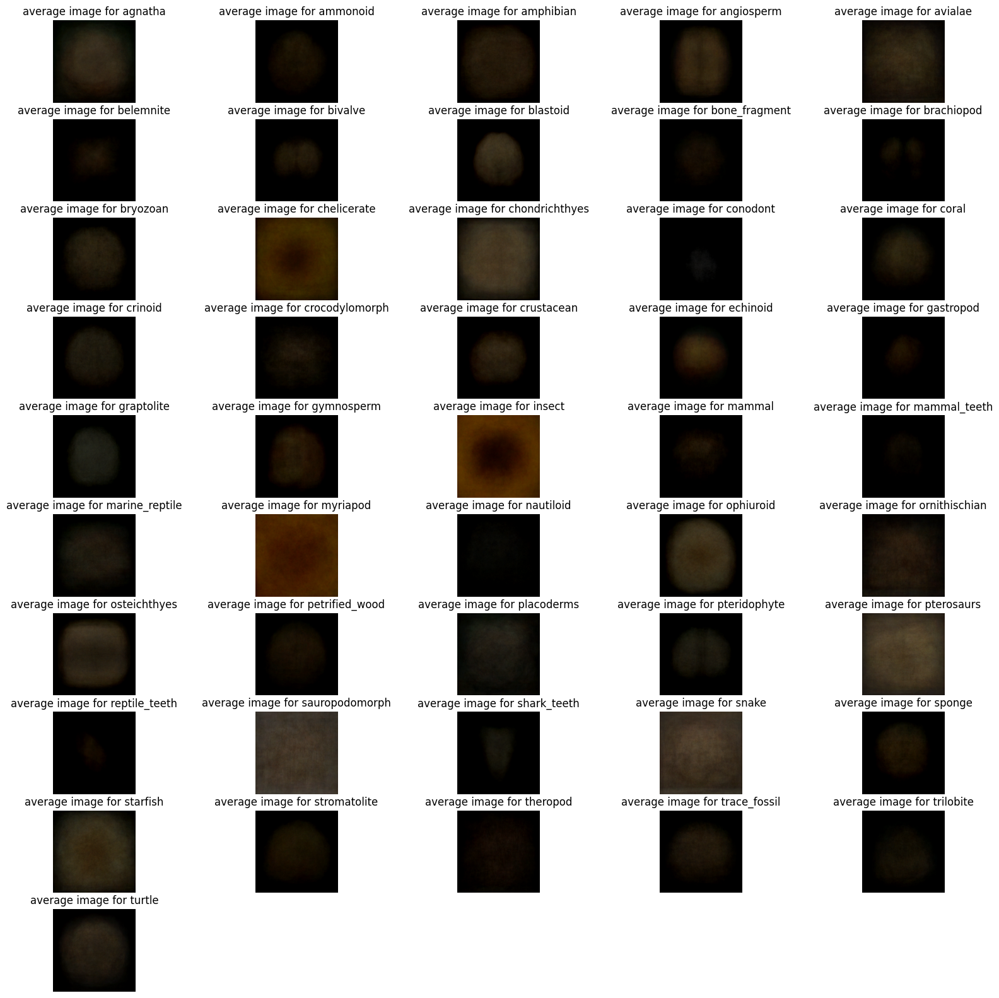

In [46]:
# Create subplots for each label
fig, axs = plt.subplots(nrows=10, ncols=5, figsize=(20, 20))
ax = axs.flatten()

# For each category find the the average image
for i, file_name in enumerate(img_paths):
  
    paths = img_paths.get(file_name)

    N = len(paths)

    # Initialize 'avg' with the first image
    avg_img = open_image(paths[0]) 
    
    # Compute the average image using blend
    for num in range(1, N):
        img = open_image(paths[num])

        # Blend image
        avg_img  = Image.blend(avg_img, img, 1 / (num+1))


    # Display the average image
    ax[i].imshow(avg_img)
    ax[i].axis("off")
    ax[i].set_title(f"average image for {file_name}")

# Remove the empty subplots
for i in range(len(img_paths), len(ax)):
    fig.delaxes(ax[i])

plt.show() 

The results are less blurry than before, but we still can't distinguish them. The average image is not useful to me, so I will not try to improve its performance any further.

# Preparing the dataset for classification task

My dataset has imbalanced classes, one or more classes have significantly more instances than the others. This can result in a model that is biased towards the majority class and performs poorly on the minority classes. To mitigate this, I will take images from the <a href="https://zenodo.org/record/6333970">FID dataset</a> to fill the gaps. 

Setps:
1. Download the <a href="https://zenodo.org/record/6333970/files/FID.zip?download=1">FID dataset</a>. 
2. Extract zip file.
3. Move all images to the root folder.
4. Check for duplcated images and remove them.
5. Check image format and convert it to PNG or JPEG if necessary.
6. Remove irrelevant images using my model.
7. Compute the number of images needed to complete my dataset and transfer them to the new location.


### Extract the FID dataset zip 

Due to non-alphanumeric filenames, I need to replace their names to ensure they are filesystem-safe.

In [47]:
import re
# Extract zip 

def safe_filename(filename):
    """Generate a filesystem-safe filename by replacing non-alphanumeric characters with underscores,
    but keep the '/' character for directory structures."""
    return re.sub(r'[^\w\-_\.\/]', '_', filename)

def extract_zip_with_rename(zip_file_path, extract_path):
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
        for member in zip_ref.infolist():
            # Create a safe filename
            safe_name = safe_filename(member.filename)
            # Construct full extraction path
            full_extract_path = os.path.join(extract_path, safe_name)

            # Ensure the directory exists for directories and files
            if member.is_dir():
                os.makedirs(full_extract_path, exist_ok=True)
            else:
                os.makedirs(os.path.dirname(full_extract_path), exist_ok=True)
                # Extract file with safe name
                with zip_ref.open(member) as source, open(full_extract_path, "wb") as target:
                    shutil.copyfileobj(source, target)


zip_file_path = "data/FID.zip"
extract_path = "data/FID"
extract_zip_with_rename(zip_file_path, extract_path)

Now that we've extracted the zip, due to the way the FID was saved with subfolders inside other subfolders, we need to traverse through all of them and move the images to the root folder.

In [48]:
dir_path_fid = os.path.join("data", "FID", "FID")

# List of image formats
image_formats = ("BMP", "DIB", "JPEG", "JPG", "JPE", "JP2", "PNG", "WEBP", "TIFF", 
                 "TIF", "GIF", "ICO", "RAS", "PBM", "PGM", "PPM", "SR", "SVG", "PSD", "RAW")

# List to store formats found
img_formats_found = []

def move_images_to_parent_folder(current_path, root_folder, root_name):
    """
    This function traverses through all subfolders and moves images to the root folder.
    """
    for filename in os.listdir(current_path):
        item_path = os.path.join(current_path, filename)
  
        # If it's an image, move it to the root folder
        if os.path.splitext(filename)[1][1:].upper() in image_formats:  # [1:] to skip the dot
            # Save image format
            img_formats_found.append(os.path.splitext(filename)[1][1:].upper())
            # Create the new path and move the images 
            dest_path = os.path.join(root_folder, filename)
            shutil.move(item_path, dest_path)
            
        # If it's a directory, we call the function again
        elif os.path.isdir(item_path):
            move_images_to_parent_folder(item_path, root_folder, root_name)
            # After processing a subfolder, check if it's empty and remove it
            if not os.listdir(item_path):
                os.rmdir(item_path)
            else:
                print("subfolder to check:", item_path)
      

# Traverse root directory
for root_name in os.listdir(dir_path_fid):
    current_path = os.path.join(dir_path_fid, root_name)
    if os.path.isdir(current_path):  # Check if it's a directory before processing
        move_images_to_parent_folder(current_path, current_path, root_name)

# Print unique format found
print(f"Image formats found: {np.unique(img_formats_found)}")


Image formats found: ['BMP' 'GIF' 'JPEG' 'JPG' 'PNG' 'TIFF' 'WEBP']


### Renaming the images using the folder name and their sample number.

In [49]:
# Code to rename images

# Loop over all subfolders in the directory
for subfolder_name in os.listdir(dir_path_fid):
    # Get the full path to the subfolder
    subfolder_path = os.path.join(dir_path_fid, subfolder_name)

    # Check if the subfolder is a directory
    if os.path.isdir(subfolder_path):
        # Loop over all files in the subfolder
        for i, filename in enumerate(os.listdir(subfolder_path)):
            # Get the full path to the file
            file_path = os.path.join(subfolder_path, filename)

            # Check if the file is an image
            if os.path.isfile(file_path):
                # Get the file extension
                extension = os.path.splitext(filename)[1]

                # Generate the new file name
                new_filename = subfolder_name + '_' + str(i+1) + extension

                # Get the full path to the new file
                new_file_path = os.path.join(subfolder_path, new_filename)

                # Rename the file
                shutil.move(file_path, new_file_path)

    """ print(f"folder {subfolder_name} is done") """

### Checking for duplicated images and images we can't open  
Once again, I'm using the ``phash`` function from the ``ImageHash`` library to find duplicated images and remove them.

In [50]:
import imagehash

# A dictionary to store the hashes of each image
hashes = {}
image_to_delete = []
duplicated_image = []
original_image = []

# Loop over all subfolders in the directory
for subfolder_name in os.listdir(dir_path_fid):
    # Get the full path to the subfolder
    subfolder_path = os.path.join(dir_path_fid, subfolder_name)

    # Check if the subfolder is a directory
    if os.path.isdir(subfolder_path):
        # Loop over all files in the subfolder
        for filename in os.listdir(subfolder_path):
            # Get the full path to the file
            file_path = os.path.join(subfolder_path, filename)

            # Check if the file is an image
            try:
                # Open the image
                with Image.open(file_path) as image:
                    # Calculate the hash of the image
                    hash = str(imagehash.phash(image))

                    # Check if the hash is already in the dictionary
                    if hash in hashes:
                        # If the hash is already in the dictionary, it means that the image is a duplicate
                        # Save duplicate file path 
                        duplicated_image.append(file_path)
                        # Save corresponding duplicate image (original image)
                        original_image.append(hashes[hash])
                    else:
                        # If the hash is not in the dictionary, add it to the dictionary
                        hashes[hash] = file_path

             # If we can't open the image we save in image_to_delete
            except:
                image_to_delete.append(file_path)

    """ print(f"folder {subfolder_name} is done") """


print(f"\nNumber of duplicate images:{len(duplicated_image)}")
print(f"Number of image we can't open:{len(image_to_delete)}")



Number of duplicate images:4151
Number of image we can't open:0


### Visualising some duplicated images

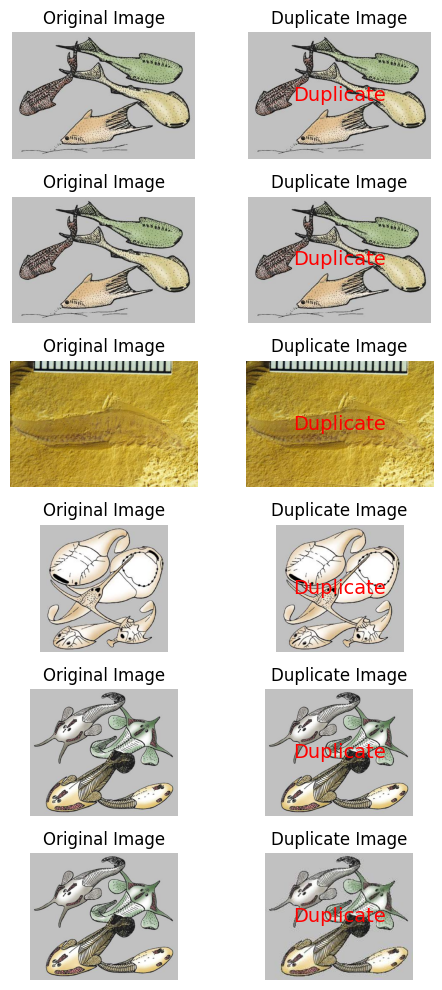

In [51]:
# Visualize the duplicate image pairs
number_of_image_to_display = 6

# Create a figure with two subplots
fig, axes = plt.subplots(number_of_image_to_display, 2, figsize=(5, 10))


for i, (duplicate_path, img_path) in enumerate(zip(duplicated_image[:number_of_image_to_display], original_image[:number_of_image_to_display])):
 
    # Open the image 
    original_img = Image.open(img_path)
    duplicate_img = Image.open(duplicate_path)

    axes[i, 0].imshow(original_img)
    axes[i, 0].set_title("Original Image")
    axes[i, 0].axis("off")

    axes[i, 1].imshow(duplicate_img)
    axes[i, 1].set_title("Duplicate Image")
    axes[i, 1].axis("off")

    # Add a text label to indicate the duplicate relationship
    axes[i, 1].text(
        0.5, 0.5, "Duplicate",
        horizontalalignment="center",
        verticalalignment="center",
        transform=axes[i, 1].transAxes,
        fontsize=14,
        color="red",
    )

# Show the figure
plt.tight_layout()
plt.show()

I will remove all duplicated images.

In [52]:
# Delete all duplicated images
for img_path in duplicated_image:
      os.remove(img_path)

### Change image formats to a compatible on.

In [53]:
# Loop over all subfolders in the directory

for subfolder_name in os.listdir(dir_path_fid):
    # Get the full path to the subfolder
    subfolder_path = os.path.join(dir_path_fid, subfolder_name)

    # Check if the subfolder is a directory
    if os.path.isdir(subfolder_path):
        # Loop over all files in the subfolder
        for filename in os.listdir(subfolder_path):
            # Get the full path to the file
            file_path = os.path.join(subfolder_path, filename)

            if filename.upper().endswith(("JPEG", "JPG", "PNG")) != True:
                # Open image
                with Image.open(file_path) as img:
                    # Convert the image to RGB mode
                    img = img.convert("RGB")

                # Change the file extension to ".png"
                new_file_path = os.path.splitext(file_path)[0] + ".png"
                # Save the image as PNG
                img.save(new_file_path, "PNG")
                # Remove the orininal file
                os.remove(file_path)
            else:
                continue      

### Checking the change of the format

In [54]:
# Initialise placeholder variable
img_format = []

# Loop over all subfolders in the directory
for subfolder_name in os.listdir(dir_path_fid):
    # Get the full path to the subfolder
    subfolder_path = os.path.join(dir_path_fid, subfolder_name)

    # Check if the subfolder is a directory
    if os.path.isdir(subfolder_path):
        # Loop over all files in the subfolder
        for filename in os.listdir(subfolder_path):
            img_path = os.path.join(subfolder_path, filename)
            with Image.open(img_path) as img:
                # Save image format
                img_format.append(img.format)

print("Image format:", np.unique(img_format))

Image format: ['JPEG' 'PNG']


All looks good.

### I will remove ``"ostracod," "foraminifer," "radiolarian," "spore_or_pollen"``

As I mentioned in the data exploration and cleaning, these images are mostly 3D renders or microscopic images. I will remove them now to speed up the prediction process.

In [55]:
# Removing monochronic images
category_to_remove = ["ostracod", "foraminifer", "radiolarian", "spore_or_pollen"]

# Loop over all subfolders in the directory
for subfolder_name in category_to_remove:
    folder_path = os.path.join(dir_path_fid, subfolder_name)
    shutil.rmtree(folder_path)

### Visualizing the number of images contained in the FID dataset.

Number of categories: 46
Number of images: 379351


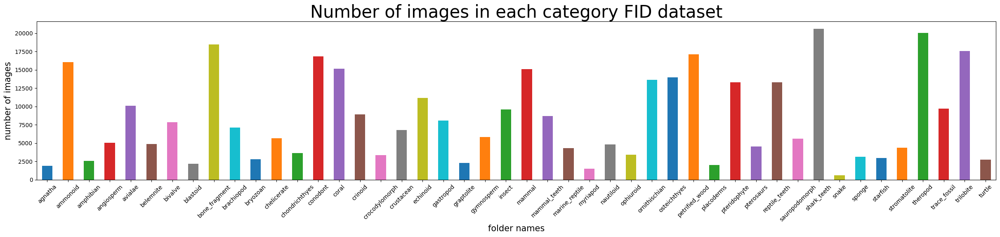

In [56]:
# Initialise empty dictionary and list
img_count = {}

# Loop over all subfolders in the directory
for subfolder_name in os.listdir(dir_path_fid):

    # Get the full path to the subfolder
    subfolder_path = os.path.join(dir_path_fid, subfolder_name)

    if os.path.isdir(subfolder_path):
        
        # Save number of images and class name
        img_count[subfolder_name] = len(os.listdir(subfolder_path))

        
print("Number of categories:", len(img_count))
print("Number of images:", sum(img_count.values()))


# Create a dictionary of kwargs
xlim_kwargs = {"left": -0.5, "right": (len(img_count) - 1) + 0.5}

# Plot the images in each folder
plt.figure(figsize=(30, 5))
for f in img_count:
    plt.bar(f, img_count.get(f), width=0.5)
plt.xlim(**xlim_kwargs)
plt.xticks(rotation=45)
plt.title("Number of images in each category FID dataset", fontsize=30)
plt.xlabel("folder names", fontsize=15)
plt.ylabel("number of images", fontsize=15)
plt.show()

We see that, for example, the ``snake`` category has a very low number of images. This will impact the number of images we can use. Nevertheless, I will still continue, remove irrelevant images, and compute the number of images I need to complete my dataset.

### Remove irrelevant images using my model.

I've opted for this approach to first filter out as many irrelevant images as possible before using them to fill gaps in my dataset. However, it does come at the expense of having to classify the entire dataset.

Here are the steps I will follow:
1. Load the images
2. Run the model on the entire FID datasst
3. Remove irrelevant images

In [57]:
# Load the FID images

gen = ImageDataGenerator(rescale=1./255)


data_fid = gen.flow_from_directory(
    dir_path_fid,
    target_size=(224, 224), 
    shuffle=False,
    interpolation="lanczos",
    batch_size=32,
    class_mode=None, #  no labels are returned
)

print("Number of batches: ", len(data_fid))

Found 379351 images belonging to 46 classes.
Number of batches:  11855


>The code below can take a long time to run, approximately 25 minutes.

In [58]:
# Compute the prediction 
fid_pred = model.predict(data_fid)


# Take the index of the maximum value from prediction array for each image
max_fid_pred = np.argmax(fid_pred, axis=1)

11855/11855 [==============================] - 1479s 125ms/step


In [59]:
# Initialize empty lists
path_fossil_img_fid_dataset = []
path_non_fossil_img_fid_dataset = []

# Check if each image is classified as fossil or non-fossil and 
# append its path to the corresponding list
for i, path in enumerate(data_fid.filenames):
    # If the images is classified as fossil
    if max_fid_pred[i] == 0.: 
        path_fossil_img_fid_dataset.append(path)
    # If the image is classified as non-fossil
    else: 
        path_non_fossil_img_fid_dataset.append(path)

print("Number of fossils:", len(path_fossil_img_fid_dataset))
print("Number of non fossils: ", len(path_non_fossil_img_fid_dataset))

Number of fossils: 291834
Number of non fossils:  87517


### Display some non-fossil images

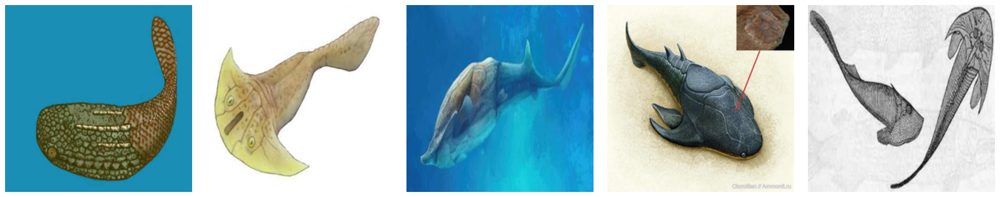

In [60]:
# Initialize a figure to plot the images
fig, axes = plt.subplots(1, 5, figsize=(20, 4))

for ax, path in zip(axes, path_non_fossil_img_fid_dataset[:5]):
    # Open and display each image
    img_path = os.path.join(dir_path_fid, path)
    img = open_image(img_path)
    ax.imshow(img)
    ax.axis('off')

plt.tight_layout()
plt.show()


### Remove non-fossils images

In [61]:
# Remove non-fossils images
for path in path_non_fossil_img_fid_dataset:
    img_path = os.path.join(dir_path_fid, path)
    if os.path.exists(img_path):
        os.remove(img_path)
    else:
        print(f"Path {img_path} couldn't be found")

### Visualize the change

Number of categories: 46
Number of images: 291834


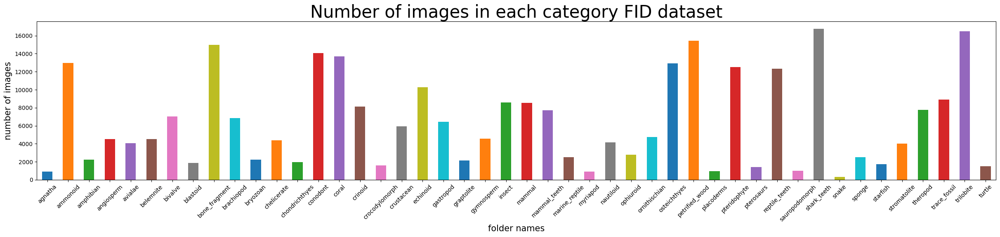

In [62]:
# Initialise empty dictionary and list
img_count = {}

# Loop over all subfolders in the directory
for subfolder_name in os.listdir(dir_path_fid):

    # Get the full path to the subfolder
    subfolder_path = os.path.join(dir_path_fid, subfolder_name)

    if os.path.isdir(subfolder_path):
        
        # Save number of images and class name
        img_count[subfolder_name] = len(os.listdir(subfolder_path))

        
print("Number of categories:", len(img_count))
print("Number of images:", sum(img_count.values()))


# Create a dictionary of kwargs
xlim_kwargs = {"left": -0.5, "right": (len(img_count) - 1) + 0.5}

# Plot the images in each folder
plt.figure(figsize=(30, 5))
for f in img_count:
    plt.bar(f, img_count.get(f), width=0.5)
plt.xlim(**xlim_kwargs)
plt.xticks(rotation=45)
plt.title("Number of images in each category FID dataset", fontsize=30)
plt.xlabel("folder names", fontsize=15)
plt.ylabel("number of images", fontsize=15)
plt.show()

I should have enough images to fill the gaps in my dataset.

Next, let's visualize the number of images in the ``reduced-FID-cleaned`` and compute how many images we should take from the FID dataset.

Number of categories: 46
Number of images: 40447


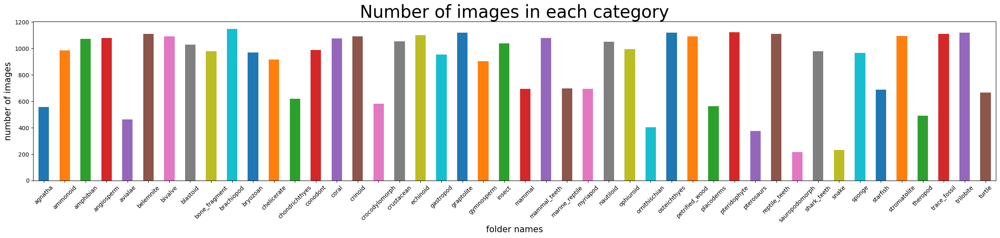

In [63]:
dir_path = "data/reduced-FID-cleaned"


# Initialise empty dictionary and list
img_count = {}

# Loop over all subfolders in the directory
for subfolder_name in os.listdir(dir_path):

    # Get the full path to the subfolder
    subfolder_path = os.path.join(dir_path, subfolder_name)

    if os.path.isdir(subfolder_path):
        
        # Save number of images and class name
        img_count[subfolder_name] = len(os.listdir(subfolder_path))

        
print("Number of categories:", len(img_count))
print("Number of images:", sum(img_count.values()))


# Create a dictionary of kwargs
xlim_kwargs = {"left": -0.5, "right": (len(img_count) - 1) + 0.5}

# Plot the images in each folder
plt.figure(figsize=(30, 5))
for f in img_count:
    plt.bar(f, img_count.get(f), width=0.5)
plt.xlim(**xlim_kwargs)
plt.xticks(rotation=45)
plt.title("Number of images in each category", fontsize=30)
plt.xlabel("folder names", fontsize=15)
plt.ylabel("number of images", fontsize=15)
plt.show()


let's find the maximum number of images 

In [64]:
# Save the number of images in a pandas Series

series = pd.Series(img_count)
series.max()

1146

1,200 images for each category should be fine.

In [65]:
# Compute the number of images to add for each category
number_of_images_to_add =  1200 - series
number_of_images_to_add

agnatha           643
ammonoid          215
amphibian         129
angiosperm        121
avialae           738
belemnite          90
bivalve           109
blastoid          171
bone_fragment     221
brachiopod         54
bryozoan          232
chelicerate       285
chondrichthyes    580
conodont          214
coral             126
crinoid           110
crocodylomorph    619
crustacean        148
echinoid          100
gastropod         246
graptolite         80
gymnosperm        298
insect            162
mammal            507
mammal_teeth      123
marine_reptile    502
myriapod          505
nautiloid         151
ophiuroid         207
ornithischian     797
osteichthyes       81
petrified_wood    110
placoderms        639
pteridophyte       77
pterosaurs        825
reptile_teeth      90
sauropodomorph    986
shark_teeth       223
snake             968
sponge            235
starfish          513
stromatolite      106
theropod          711
trace_fossil       91
trilobite          81
turtle    

When adding new images, we may end up with duplicates of the same images. Normally, this should be marginal. I will still check for duplicated images and remove them if needed after the transfer is completed.

In [66]:
# Random numbers generated will be the same each time the program runs 
random.seed(0)

# Loop over all subfolders in the directory
for category, value in number_of_images_to_add.items():
    new_location = os.path.join("data/reduced-FID-cleaned", category)
    category_path = os.path.join(dir_path_fid, category)
    files_names = os.listdir(category_path)


     # Adjust value if necessary
    if len(files_names) < value:
        value = len(files_names)
        
    # Get the images 
    sampled_files = random.sample(files_names, value)

    for filename in sampled_files:
        # Prepare the new name
        new_name = "add_image_" + filename


        # Create source and destination paths
        source_path = os.path.join(category_path, filename)
        dest_path = os.path.join(new_location, new_name)

        
        # Move and rename the file
        shutil.move(source_path, dest_path)

To ensure we don't have duplicated images, let's compute the ``phash`` and remove any duplicated images found.

In [67]:
# A dictionary to store the hashes of each image
hashes = {}
image_to_delete = []
duplicated_image = []
original_image = []

# Loop over all subfolders in the directory
for subfolder_name in os.listdir(dir_path):
    # Get the full path to the subfolder
    subfolder_path = os.path.join(dir_path, subfolder_name)

    # Check if the subfolder is a directory
    if os.path.isdir(subfolder_path):
        # Loop over all files in the subfolder
        for filename in os.listdir(subfolder_path):
            # Get the full path to the file
            file_path = os.path.join(subfolder_path, filename)

            # Check if the file is an image
            try:
                # Open the image
                with Image.open(file_path) as image:
                    # Calculate the hash of the image
                    hash = str(imagehash.phash(image))

                    # Check if the hash is already in the dictionary
                    if hash in hashes:
                        # If the hash is already in the dictionary, it means that the image is a duplicate
                        # Save duplicate file path 
                        duplicated_image.append(file_path)
                        # Save corresponding duplicate image (original image)
                        original_image.append(hashes[hash])
                    else:
                        # If the hash is not in the dictionary, add it to the dictionary
                        hashes[hash] = file_path

             # If we can't open the image we save in image_to_delete
            except:
                image_to_delete.append(file_path)

    """ print(f"folder {subfolder_name} is done") """


print(f"\nNumber of duplicate images:{len(duplicated_image)}")
print(f"Number of image we can't open:{len(image_to_delete)}")



Number of duplicate images:3545
Number of image we can't open:0


There are quite a few duplicated images; let's remove them. But before we do that, let's visualize some of the duplicated images.

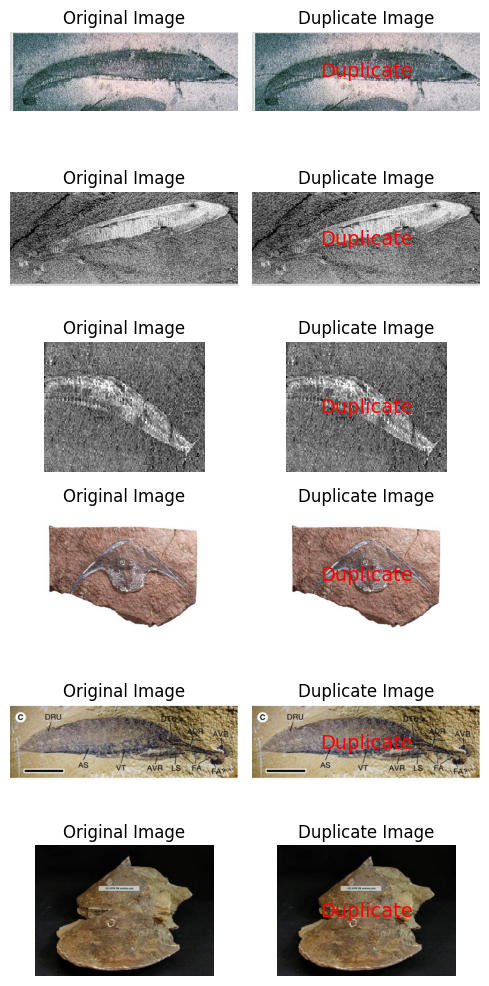

In [68]:
# Visualize the duplicate image pairs
number_of_image_to_display = 6

# Create a figure with two subplots
fig, axes = plt.subplots(number_of_image_to_display, 2, figsize=(5, 10))


for i, (duplicate_path, img_path) in enumerate(zip(duplicated_image[:number_of_image_to_display], original_image[:number_of_image_to_display])):
 
    # Open the image 
    original_img = Image.open(img_path)
    duplicate_img = Image.open(duplicate_path)

    axes[i, 0].imshow(original_img)
    axes[i, 0].set_title("Original Image")
    axes[i, 0].axis("off")

    axes[i, 1].imshow(duplicate_img)
    axes[i, 1].set_title("Duplicate Image")
    axes[i, 1].axis("off")

    # Add a text label to indicate the duplicate relationship
    axes[i, 1].text(
        0.5, 0.5, "Duplicate",
        horizontalalignment="center",
        verticalalignment="center",
        transform=axes[i, 1].transAxes,
        fontsize=14,
        color="red",
    )

# Show the figure
plt.tight_layout()
plt.show()

### Remove all duplicated images

In [69]:
# Delete all duplicated images
for img_path in duplicated_image:
      os.remove(img_path)

Unfortunately, we still have irrelevant images. This time, I will need to go through the dataset and remove them. While I'm not an expert, an image like the one below is clearly not a fossil.


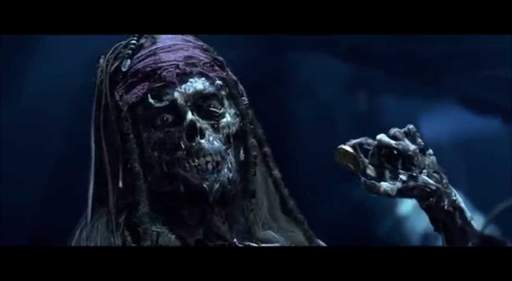

I've made a list of a few irrelevant images to remove. Some paths might not be in your dataset. However, if they do exist, we'll remove them.

>**Please note**:<br>
Your dataset might differ slightly from mine. This is because the model isn't 100% reproducible, which can lead to variations in how images are classified within your dataset.  <br><br>

<br><br>
Below, I'm visualizing some irrelevant images. If certain images are not present in your dataset, the corresponding plot will display ``'No image'``. I use this method to visualize irrelevant images and avoid empty plots.

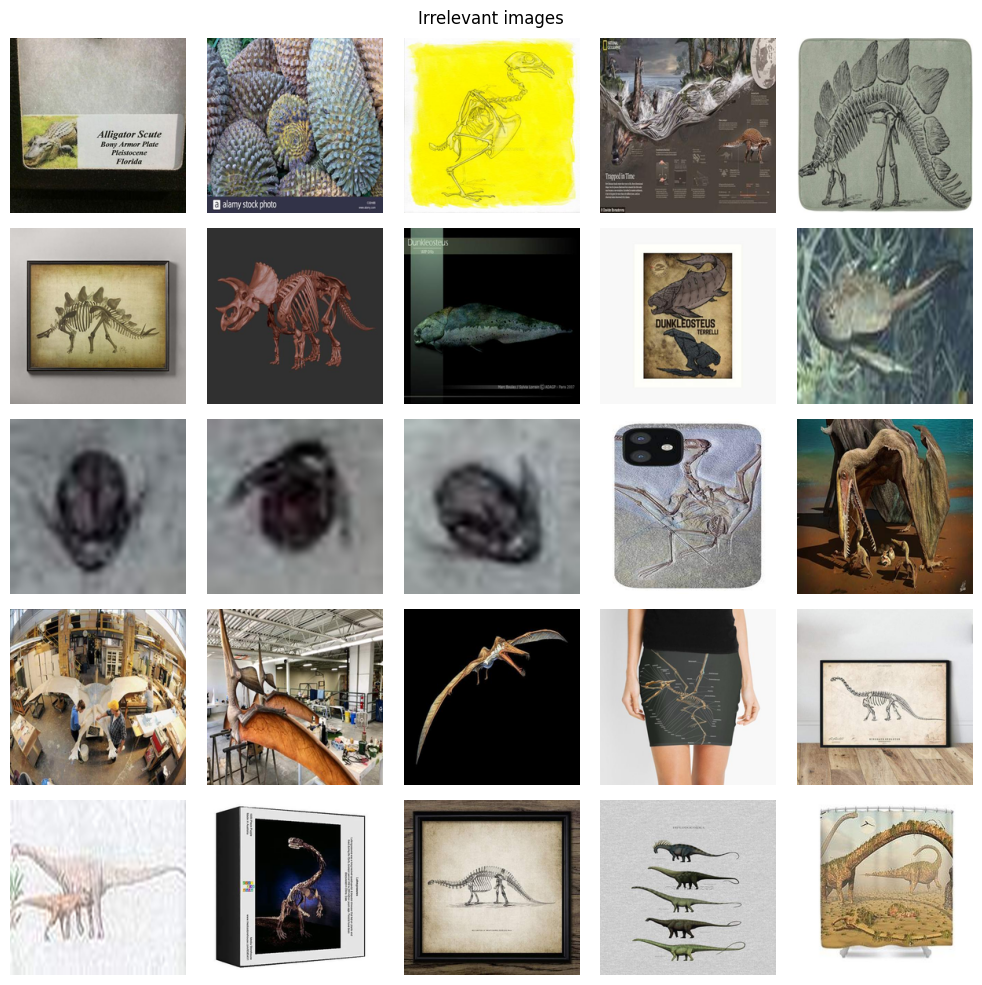

In [93]:
# Removing irrelevant images
img_to_remove = [
    "data/reduced-FID-cleaned/crocodylomorph/crocodylomorph_577.jpg","data/reduced-FID-cleaned/avialae/avialae_902.jpg", "data/reduced-FID-cleaned/avialae/avialae_942.jpg", "data/reduced-FID-cleaned/gymnosperm/add_image_gymnosperm_584.jpg", "data/reduced-FID-cleaned/gymnosperm/add_image_gymnosperm_5134.jpg", "data/reduced-FID-cleaned/gymnosperm/gymnosperm_172.jpg", "data/reduced-FID-cleaned/add_image_chelicerate_364.jpg","data/reduced-FID-cleaned/add_image_crinoid_6918.jpg",
    "data/reduced-FID-cleaned/avialae/add_image_avialae_7698.png", "data/reduced-FID-cleaned/avialae/avialae_1125.jpg", "data/reduced-FID-cleaned/chondrichthyes/add_image_chondrichthyes_1321.jpg","data/reduced-FID-cleaned/add_image_chelicerate_795.jpg", "data/reduced-FID-cleaned/add_image_chelicerate_1051.jpg","data/reduced-FID-cleaned/add_image_chondrichthyes_447.jpg","data/reduced-FID-cleaned/belemnite_49.jpg", 
    "data/reduced-FID-cleaned/myriapod/add_image_myriapod_1113.jpg", "data/reduced-FID-cleaned/myriapod/myriapod_451.jpg", "data/reduced-FID-cleaned/myriapod/myriapod_776.jpg", "data/reduced-FID-cleaned/ornithischian/add_image_ornithischian_611.jpg", "data/reduced-FID-cleaned/ornithischian/ornithischian_101.jpg", "data/reduced-FID-cleaned/ornithischian/ornithischian_387.jpg", "data/reduced-FID-cleaned/ornithischian/ornithischian_679.jpg", "data/reduced-FID-cleaned/osteichthyes/add_image_osteichthyes_1626.jpg", "data/reduced-FID-cleaned/placoderms/add_image_placoderms_2.jpg", "data/reduced-FID-cleaned/placoderms/add_image_placoderms_273.jpg",
    "data/reduced-FID-cleaned/placoderms/add_image_placoderms_608.jpeg", "data/reduced-FID-cleaned/placoderms/add_image_placoderms_625.jpg", "data/reduced-FID-cleaned/placoderms/add_image_placoderms_975.jpg", "data/reduced-FID-cleaned/placoderms/add_image_placoderms_995.jpg", "data/reduced-FID-cleaned/placoderms/add_image_placoderms_1042.jpg", "data/reduced-FID-cleaned/placoderms/add_image_placoderms_1065.jpg", "data/reduced-FID-cleaned/placoderms/add_image_placoderms_1770.jpg", "data/reduced-FID-cleaned/placoderms/add_image_placoderms_2014.jpg", "data/reduced-FID-cleaned/placoderms/add_image_placoderms_2015.jpg", "data/reduced-FID-cleaned/placoderms/add_image_placoderms_2017.jpg",
    "data/reduced-FID-cleaned/placoderms/add_image_placoderms_2019.jpg", "data/reduced-FID-cleaned/placoderms/placoderms_969.jpg", "data/reduced-FID-cleaned/placoderms/placoderms_1193.jpg", "data/reduced-FID-cleaned/placoderms/placoderms_1195.jpg", "data/reduced-FID-cleaned/pterosaurs/add_image_pterosaurs_654.jpg", "data/reduced-FID-cleaned/pterosaurs/add_image_pterosaurs_902.jpg", "data/reduced-FID-cleaned/pterosaurs/add_image_pterosaurs_1105.jpg", "data/reduced-FID-cleaned/pterosaurs/add_image_pterosaurs_1468.jpg", "data/reduced-FID-cleaned/pterosaurs/add_image_pterosaurs_1513.jpg", "data/reduced-FID-cleaned/pterosaurs/add_image_pterosaurs_3091.jpg", 
    "data/reduced-FID-cleaned/pterosaurs/add_image_pterosaurs_3278.jpg", "data/reduced-FID-cleaned/pterosaurs/add_image_pterosaurs_3559.jpg",  "data/reduced-FID-cleaned/pterosaurs/pterosaurs_517.jpg", "data/reduced-FID-cleaned/pterosaurs/pterosaurs_1084.jpg", "data/reduced-FID-cleaned/sauropodomorph/add_image_sauropodomorph_326.jpg", "data/reduced-FID-cleaned/sauropodomorph/add_image_sauropodomorph_424.jpg", "data/reduced-FID-cleaned/sauropodomorph/add_image_sauropodomorph_626.jpg", "data/reduced-FID-cleaned/sauropodomorph/add_image_sauropodomorph_696.png", "data/reduced-FID-cleaned/sauropodomorph/add_image_sauropodomorph_3145.jpg",
    "data/reduced-FID-cleaned/sauropodomorph/add_image_sauropodomorph_3705.jpg", "data/reduced-FID-cleaned/sauropodomorph/add_image_sauropodomorph_5297.jpg", "data/reduced-FID-cleaned/sauropodomorph/sauropodomorph_1033.jpg", "data/reduced-FID-cleaned/snake/add_image_snake_6.jpg", "data/reduced-FID-cleaned/snake/add_image_snake_39.jpg", "data/reduced-FID-cleaned/snake/add_image_snake_469.jpg", "data/reduced-FID-cleaned/starfish/add_image_starfish_853.jpg", "data/reduced-FID-cleaned/starfish/add_image_starfish_886.jpg", "data/reduced-FID-cleaned/theropod/add_image_theropod_5164.png", "data/reduced-FID-cleaned/theropod/add_image_theropod_6097.jpg", "data/reduced-FID-cleaned/theropod/add_image_theropod_11532.jpg", 
    "data/reduced-FID-cleaned/theropod/add_image_theropod_14611.jpg", "data/reduced-FID-cleaned/theropod/theropod_471.jpg", "data/reduced-FID-cleaned/turtle/add_image_turtle_52.jpg", "data/reduced-FID-cleaned/turtle/add_image_turtle_1138.jpg", "data/reduced-FID-cleaned/turtle/add_image_turtle_1228.jpg", "data/reduced-FID-cleaned/agnatha/add_image_agnatha_35.jpg", "data/reduced-FID-cleaned/agnatha/add_image_agnatha_386.png", "data/reduced-FID-cleaned/pterosaurs/add_image_pterosaurs_3560.jpg", "data/reduced-FID-cleaned/add_image_angiosperm_4379.jpg", "data/reduced-FID-cleaned/add_image_avialae_6279.png", 
    "data/reduced-FID-cleaned/agnatha/agnatha_749.jpg", "data/reduced-FID-cleaned/agnatha/agnatha_956.jpg", "data/reduced-FID-cleaned/amphibian/amphibian_176.jpeg", "data/reduced-FID-cleaned/add_image_agnatha_340.jpg", "data/reduced-FID-cleaned/add_image_agnatha_407.jpg", "data/reduced-FID-cleaned/add_image_ammonoid_3187.jpg", "data/reduced-FID-cleaned/add_image_avialae_5915.jpg", "data/reduced-FID-cleaned/add_image_avialae_6904.jpg", 
    "data/reduced-FID-cleaned/angiosperm/add_image_angiosperm_1363.png", "data/reduced-FID-cleaned/angiosperm/add_image_angiosperm_4380.jpg", "data/reduced-FID-cleaned/angiosperm/angiosperm_178.jpg", "data/reduced-FID-cleaned/add_image_agnatha_398.jpg", "data/reduced-FID-cleaned/add_image_agnatha_457.jpg","data/reduced-FID-cleaned/add_image_chelicerate_308.jpg","data/reduced-FID-cleaned/add_image_pterosaurs_531.jpg", 
    "data/reduced-FID-cleaned/chondrichthyes/add_image_chondrichthyes_2852.jpg",  "data/reduced-FID-cleaned/chondrichthyes/add_image_chondrichthyes_2862.jpg", "data/reduced-FID-cleaned/chondrichthyes/chondrichthyes_583.jpg", "data/reduced-FID-cleaned/add_image_agnatha_402.jpg", "data/reduced-FID-cleaned/add_image_brachiopod_2325.png", "data/reduced-FID-cleaned/add_image_chelicerate_1143.jpg", "data/reduced-FID-cleaned/add_image_chondrichthyes_488.jpg",
    "data/reduced-FID-cleaned/chondrichthyes/chondrichthyes_714.jpg", "data/reduced-FID-cleaned/chondrichthyes/chondrichthyes_867.png", "data/reduced-FID-cleaned/crocodylomorph/add_image_crocodylomorph_805.jpg", "data/reduced-FID-cleaned/crocodylomorph/add_image_crocodylomorph_1501.jpg", "data/reduced-FID-cleaned/add_image_bone_fragment_3571.jpg", "data/reduced-FID-cleaned/add_image_chelicerate_894.jpg", "data/reduced-FID-cleaned/add_image_chelicerate_1935.jpg", "data/reduced-FID-cleaned/add_image_chondrichthyes_533.jpg", 
    "data/reduced-FID-cleaned/gymnosperm/gymnosperm_192.jpg","data/reduced-FID-cleaned/gymnosperm/gymnosperm_362.jpg", "data/reduced-FID-cleaned/gymnosperm/gymnosperm_506.jpg", "data/reduced-FID-cleaned/gymnosperm/gymnosperm_701.jpg", "data/reduced-FID-cleaned/gymnosperm/gymnosperm_971.jpg","data/reduced-FID-cleaned/agnatha/add_image_agnatha_129.jpg", "data/reduced-FID-cleaned/agnatha/add_image_agnatha_353.jpg", "data/reduced-FID-cleaned/agnatha/add_image_agnatha_512.jpg", "data/reduced-FID-cleaned/add_image_coral_12579.jpg", "data/reduced-FID-cleaned/avialae_404.jpg", 
    "data/reduced-FID-cleaned/agnatha/add_image_agnatha_510.jpg", "data/reduced-FID-cleaned/agnatha/add_image_agnatha_838.jpg", "data/reduced-FID-cleaned/agnatha/add_image_agnatha_844.jpg", "data/reduced-FID-cleaned/agnatha/add_image_agnatha_1643.jpg", "data/reduced-FID-cleaned/agnatha/agnatha_223.jpg", "data/reduced-FID-cleaned/agnatha/agnatha_673.jpg", "data/reduced-FID-cleaned/agnatha/agnatha_1185.jpg", "data/reduced-FID-cleaned/add_image_chondrichthyes_3390.jpg", "data/reduced-FID-cleaned/add_image_crinoid_4607.jpg", 
    "data/reduced-FID-cleaned/amphibian/amphibian_190.jpg", "data/reduced-FID-cleaned/amphibian/amphibian_321.jpg", "data/reduced-FID-cleaned/agnatha/agnatha_75.jpg", "data/reduced-FID-cleaned/agnatha/add_image_agnatha_95.jpg", "data/reduced-FID-cleaned/add_image_blastoid_1826.jpg", "data/reduced-FID-cleaned/add_image_chondrichthyes_1521.jpg", "data/reduced-FID-cleaned/add_image_mammal_1566.jpg", "data/reduced-FID-cleaned/add_image_marine_reptile_318.jpg", "data/reduced-FID-cleaned/add_image_myriapod_915.jpg",
    "data/reduced-FID-cleaned/add_image_bivalve_1559.jpg", "data/reduced-FID-cleaned/add_image_chondrichthyes_1000.jpg", "data/reduced-FID-cleaned/add_image_pterosaurs_2032.jpg","data/reduced-FID-cleaned/add_image_sauropodomorph_3520.jpg", "data/reduced-FID-cleaned/add_image_sponge_242.jpg", "data/reduced-FID-cleaned/bivalve_218.jpg", "data/reduced-FID-cleaned/angiosperm/angiosperm_294.jpg", "data/reduced-FID-cleaned/avialae/add_image_avialae_533.jpg",
    "data/reduced-FID-cleaned/chelicerate_580.jpg", "data/reduced-FID-cleaned/chelicerate_677.jpg", "data/reduced-FID-cleaned/chelicerate_1118.jpg", "data/reduced-FID-cleaned/coral_359.jpg", "data/reduced-FID-cleaned/coral_463.jpg""data/reduced-FID-cleaned/nautiloid_184.jpg","data/reduced-FID-cleaned/petrified_wood_194.jpg", "data/reduced-FID-cleaned/add_image_avialae_7777.jpg",
    "data/reduced-FID-cleaned/coral_465.jpg", "data/reduced-FID-cleaned/crinoid_449.jpg", "data/reduced-FID-cleaned/gymnosperm_211.jpg", "data/reduced-FID-cleaned/gymnosperm_417.jpg", "data/reduced-FID-cleaned/gymnosperm_384.jpg", "data/reduced-FID-cleaned/gymnosperm_426.jpg", "data/reduced-FID-cleaned/insect_377.jpg", "data/reduced-FID-cleaned/ophiuroid_358.jpg", "data/reduced-FID-cleaned/petrified_wood_519.jpg",
    "data/reduced-FID-cleaned/placoderms_608.jpg", "data/reduced-FID-cleaned/placoderms_615.jpg" ,"data/reduced-FID-cleaned/theropod_218.png","data/reduced-FID-cleaned/blastoid_1047.jpg", "data/reduced-FID-cleaned/chelicerate_329.jpg", "data/reduced-FID-cleaned/chondrichthyes_263.jpg", "data/reduced-FID-cleaned/chondrichthyes_666.jpg",  "data/reduced-FID-cleaned/add_image_myriapod_912.jpg", "data/reduced-FID-cleaned/add_image_myriapod_1069.jpg", "data/reduced-FID-cleaned/add_image_ornithischian_6219.jpg", "data/reduced-FID-cleaned/add_image_ornithischian_6935.jpg","data/reduced-FID-cleaned/add_image_ornithischian_10858.jpg", "data/reduced-FID-cleaned/add_image_ornithischian_12172.jpg", 
    "data/reduced-FID-cleaned/add_image_crocodylomorph_1652.jpg", "data/reduced-FID-cleaned/add_image_mammal_960.jpg", "data/reduced-FID-cleaned/add_image_mammal_873.jpg", "data/reduced-FID-cleaned/add_image_mammal_803.jpg", "data/reduced-FID-cleaned/add_image_pterosaurs_3366.jpg", "data/reduced-FID-cleaned/add_image_sponge_773.jpg", "data/reduced-FID-cleaned/add_image_stromatolite_3367.jpg",
    "data/reduced-FID-cleaned/add_image_theropod_13085.jpg", "data/reduced-FID-cleaned/add_image_trace_fossil_7382.jpg", "data/reduced-FID-cleaned/add_image_turtle_1781.jpg", "data/reduced-FID-cleaned/agnatha_75.jpg", "data/reduced-FID-cleaned/ammonoid_8.jpg", "data/reduced-FID-cleaned/ammonoid_166.jpg", "data/reduced-FID-cleaned/avialae_58.jpg", "data/reduced-FID-cleaned/chelicerate_351.jpg",
    "data/reduced-FID-cleaned/bivalve_725.jpg", "data/reduced-FID-cleaned/blastoid_1046.jpg", "data/reduced-FID-cleaned/bone_fragment_659.png", "data/reduced-FID-cleaned/brachiopod_166.jpg","data/reduced-FID-cleaned/bryozoan_91.jpg",  "data/reduced-FID-cleaned/bryozoan_376.jpg", "data/reduced-FID-cleaned/chelicerate_86.jpg", "data/reduced-FID-cleaned/chelicerate_242.jpg",  
    "data/reduced-FID-cleaned/placoderms/add_image_placoderms_907.jpg", "data/reduced-FID-cleaned/angiosperm/angiosperm_1042.jpg", "data/reduced-FID-cleaned/angiosperm/angiosperm_1043.jpg", "data/reduced-FID-cleaned/angiosperm/angiosperm_1040.jpg", "data/reduced-FID-cleaned/avialae/add_image_avialae_606.png",  "data/reduced-FID-cleaned/avialae/add_image_avialae_1288.jpg", 
    "data/reduced-FID-cleaned/avialae/add_image_avialae_1546.jpg", "data/reduced-FID-cleaned/avialae/add_image_avialae_1606.jpg", "data/reduced-FID-cleaned/avialae/add_image_avialae_3229.jpg", "data/reduced-FID-cleaned/avialae/add_image_avialae_5392.jpg", "data/reduced-FID-cleaned/avialae/add_image_avialae_9407.jpg", "data/reduced-FID-cleaned/avialae/add_image_avialae_9891.jpg", "data/reduced-FID-cleaned/avialae/avialae_133.png", 
    "data/reduced-FID-cleaned/chelicerate/chelicerate_283.jpg", "data/reduced-FID-cleaned/chondrichthyes/add_image_chondrichthyes_2855.jpg", "data/reduced-FID-cleaned/chondrichthyes/chondrichthyes_414.jpg", "data/reduced-FID-cleaned/chondrichthyes/chondrichthyes_406.jpg", "data/reduced-FID-cleaned/chondrichthyes/chondrichthyes_398.jpg", "data/reduced-FID-cleaned/chondrichthyes/chondrichthyes_482.jpg", "data/reduced-FID-cleaned/chondrichthyes/chondrichthyes_545.jpeg", 
    "data/reduced-FID-cleaned/chondrichthyes/chondrichthyes_698.jpg", "data/reduced-FID-cleaned/crinoid/add_image_crinoid_8.jpg", "data/reduced-FID-cleaned/crinoid/crinoid_119.jpg", "data/reduced-FID-cleaned/crocodylomorph/add_image_crocodylomorph_557.jpg", "data/reduced-FID-cleaned/crocodylomorph/add_image_crocodylomorph_617.jpg", "data/reduced-FID-cleaned/crocodylomorph/add_image_crocodylomorph_1709.jpg", "data/reduced-FID-cleaned/crocodylomorph/add_image_crocodylomorph_2493.jpg", 
    "data/reduced-FID-cleaned/crocodylomorph/add_image_crocodylomorph_2511.jpg", "data/reduced-FID-cleaned/crocodylomorph/add_image_crocodylomorph_2862.jpg", "data/reduced-FID-cleaned/crocodylomorph/add_image_crocodylomorph_3011.jpg","data/reduced-FID-cleaned/crocodylomorph/crocodylomorph_221.jpeg", "data/reduced-FID-cleaned/crustacean/crustacean_56.jpg", "data/reduced-FID-cleaned/crustacean/crustacean_103.jpg", "data/reduced-FID-cleaned/crustacean/crustacean_197.jpg", 
    "data/reduced-FID-cleaned/gymnosperm/add_image_gymnosperm_2175.jpg", "data/reduced-FID-cleaned/gymnosperm/gymnosperm_38.jpg", "data/reduced-FID-cleaned/gymnosperm/gymnosperm_393.jpg", "data/reduced-FID-cleaned/gymnosperm/gymnosperm_528.jpg", "data/reduced-FID-cleaned/gymnosperm/gymnosperm_771.jpg", "data/reduced-FID-cleaned/gymnosperm/gymnosperm_922.jpg", "data/reduced-FID-cleaned/gymnosperm/gymnosperm_913.jpg", "data/reduced-FID-cleaned/gymnosperm/gymnosperm_908.jpg", 
    "data/reduced-FID-cleaned/gymnosperm/gymnosperm_1048.jpg", "data/reduced-FID-cleaned/insect/add_image_insect_1676.jpg", "data/reduced-FID-cleaned/insect/insect_115.jpg", "data/reduced-FID-cleaned/insect/insect_495.jpg", "data/reduced-FID-cleaned/insect/insect_511.jpg", "data/reduced-FID-cleaned/mammal/add_image_mammal_5653.png", "data/reduced-FID-cleaned/mammal/add_image_mammal_5898.png", "data/reduced-FID-cleaned/mammal/add_image_mammal_7055.jpg", 
    "data/reduced-FID-cleaned/mammal/add_image_mammal_7742.jpg", "data/reduced-FID-cleaned/mammal/add_image_mammal_9649.jpg", "data/reduced-FID-cleaned/mammal/add_image_mammal_11300.jpeg", "data/reduced-FID-cleaned/mammal/add_image_mammal_13878.jpg", "data/reduced-FID-cleaned/mammal/mammal_447.png", "data/reduced-FID-cleaned/mammal/mammal_664.jpg", "data/reduced-FID-cleaned/mammal/mammal_902.jpg", "data/reduced-FID-cleaned/myriapod/add_image_myriapod_88.jpg",  
    ]


# Check if paths exist
exists_paths = []

for path in img_to_remove:
    if os.path.exists(path):
        # Save the path if it exists
        exists_paths.append(path)
    else:
        # Print a message for paths that are not found
        """ print("Path not found:", path) """


# Plot the first 25 images from the "exists_paths" list
fig, axs = plt.subplots(5, 5, figsize=(10, 10))

for path, ax in zip(exists_paths[:25], axs.ravel()):
    if os.path.exists(path):
        # Plot the images using the function open_image
        img = open_image(path)
        ax.imshow(img)
        ax.axis('off')

plt.suptitle("Irrelevant images")
plt.tight_layout()
plt.show()

### Remove all irrelevant images

In [94]:
# Remove images
for path in img_to_remove:
    # Check if the path exists. If true we remove it
    if os.path.exists(path):
        os.remove(path)
    else:
        """ print(f"path to check {path}") """

### Visualize if we were able to fill the gaps.

Number of categories: 46
Number of images: 50925


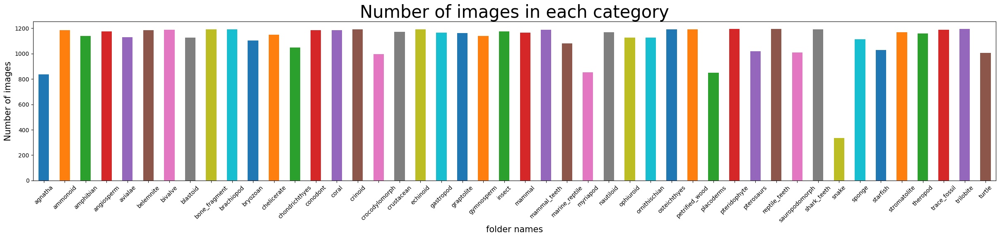

In [95]:
dir_path = "data/reduced-FID-cleaned"


# Initialise empty dictionary and list
img_count = {}

# Loop over all subfolders in the directory
for subfolder_name in os.listdir(dir_path):

    # Get the full path to the subfolder
    subfolder_path = os.path.join(dir_path, subfolder_name)

    if os.path.isdir(subfolder_path):
        
        # Save number of images and class name
        img_count[subfolder_name] = len(os.listdir(subfolder_path))

        
print("Number of categories:", len(img_count))
print("Number of images:", sum(img_count.values()))


# Create a dictionary of kwargs
xlim_kwargs = {"left": -0.5, "right": (len(img_count) - 1) + 0.5}

# Plot the images in each folder
plt.figure(figsize=(30, 5))
for f in img_count:
    plt.bar(f, img_count.get(f), width=0.5)
plt.xlim(**xlim_kwargs)
plt.xticks(rotation=45)
plt.title("Number of images in each category", fontsize=30)
plt.xlabel("folder names", fontsize=15)
plt.ylabel("Number of images", fontsize=15)
plt.show()

Overall, yes, snakes are still underrepresented, but I can't do much to mitigate this. So, let's prepare our dataset for classifying fossils.

### Split the cleand dataset in train, valid and test sets

In [96]:
# Splits the dataset
splitfolders.ratio("data/reduced-FID-cleaned", output="data/reduced-FID-cleaned-splited", seed=0, ratio=(.7, .15, .15))

All semes ok I'm good to go to the next setps classify fossils

Check: ``Fossil-classifier.ipynb``

In [ ]:
# Removing unnecessary folder to free up space 

shutil.rmtree("data/fossil-vs-non-fossil-splited")
shutil.rmtree("data/fossil-vs-non-fossil")
shutil.rmtree("data/reduced-FID")
shutil.rmtree("data/reduced-FID-cleaned")
shutil.rmtree("data/FID")